# Spatio-Temporal Clustering

Spatial Temporal Clustering
```
# -------------------
# Prerequisites:
#    - Code in '1_get_data.R' must be run in order to download and format data
# 
# Functionality:
#
# (1) Spatio-Temporal clustering using ST-DBSCAN
#
# -------------------
```

## Module Imports

In [46]:
import matplotlib.pyplot as plt
import pandas as pd
from st_dbscan import ST_DBSCAN
from sklearn.base import BaseEstimator, ClusterMixin
from sklearn.metrics import silhouette_score, make_scorer
from sklearn.model_selection import GridSearchCV
import itertools
import geopandas as gpd
from shapely.geometry import Polygon

## 1. Data preparation

### 1.1 - Read data from file

In [47]:
# Read all data from file
data = pd.read_csv('gla_collisions_sf.csv', parse_dates=['date'])

print(data.shape, "\n")
print(data.dtypes)
data.head(2)

(67653, 44) 

X                                                       int64
Y                                                       int64
accident_index                                         object
accident_year                                           int64
accident_reference                                     object
longitude                                             float64
latitude                                              float64
police_force                                           object
accident_severity                                      object
number_of_vehicles                                      int64
number_of_casualties                                    int64
date                                           datetime64[ns]
day_of_week                                            object
time                                                   object
local_authority_district                               object
local_authority_ons_district                           o

C:\Users\Boomerang\AppData\Local\Temp\ipykernel_28380\2859428482.py:2: DtypeWarning: Columns (2,4,20) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('gla_collisions_sf.csv', parse_dates=['date'])


,X,Y,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,trunk_road_flag,lsoa_of_accident_location,enhanced_severity_collision,datetime,NAME,HECTARES,NONLD_AREA,POLY_ID,hour_decimal,month
0,521389,175144,2020010219808,2020,10219808,NaN,NaN,Metropolitan Police,Slight,1,...,Non-trunk,E01004576,-1,2020/02/04 09:00:00+00,London Euro Region,159469.7,2129.716,124433,9.000000,2020-02
1,529337,176237,2020010220496,2020,10220496,NaN,NaN,Metropolitan Police,Slight,1,...,Non-trunk,E01003034,-1,2020/04/27 12:55:00+00,London Euro Region,159469.7,2129.716,124433,13.916667,2020-04


In [48]:
boundaries = {
    'x_max': int(data["X"].max()),
    'x_min': int(data["X"].min()),
    'y_max': int(data["Y"].max()),
    'y_min': int(data["Y"].min())
}
print(boundaries)

{'x_max': 561143, 'x_min': 503690, 'y_max': 200902, 'y_min': 156748}


### 1.2 - Filter rows to create 3 separate datasets for analysis; Feburary 2020, February 2021 and Feburary 2022

In [49]:
# Get data for February 2020
feb_2020 = data[data.month == '2020-01']
print(feb_2020.shape)
feb_2020.head(2)

(1947, 44)


,X,Y,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,trunk_road_flag,lsoa_of_accident_location,enhanced_severity_collision,datetime,NAME,HECTARES,NONLD_AREA,POLY_ID,hour_decimal,month
2,526432,182761,2020010228005,2020,10228005,NaN,NaN,Metropolitan Police,Slight,1,...,Non-trunk,E01004726,-1,2020/01/01 01:25:00+00,London Euro Region,159469.7,2129.716,124433,1.416667,2020-01
3,538676,184371,2020010228006,2020,10228006,NaN,NaN,Metropolitan Police,Serious,1,...,Non-trunk,E01003617,-1,2020/01/01 01:50:00+00,London Euro Region,159469.7,2129.716,124433,1.833333,2020-01


In [50]:
# Get data for February 2021
feb_2021 = data[data.month == '2021-02']
print(feb_2021.shape)
feb_2021.head(2)

(1184, 44)


,X,Y,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,trunk_road_flag,lsoa_of_accident_location,enhanced_severity_collision,datetime,NAME,HECTARES,NONLD_AREA,POLY_ID,hour_decimal,month
22194,541572,188756,2021010290989,2021,010290989,NaN,NaN,Metropolitan Police,Slight,2,...,Non-trunk,E01003794,-1,2021/02/01 04:00:00+00,London Euro Region,159469.7,2129.716,124433,4.000000,2021-02
22195,527646,173230,2021010290997,2021,010290997,NaN,NaN,Metropolitan Police,Slight,2,...,Non-trunk,E01004543,-1,2021/02/01 07:40:00+00,London Euro Region,159469.7,2129.716,124433,7.666667,2021-02


In [51]:
# Get data for February 2022
feb_2022 = data[data.month == '2022-02']
print(feb_2022.shape)
feb_2022.head(2)

(1664, 44)


,X,Y,accident_index,accident_year,accident_reference,longitude,latitude,police_force,accident_severity,number_of_vehicles,...,trunk_road_flag,lsoa_of_accident_location,enhanced_severity_collision,datetime,NAME,HECTARES,NONLD_AREA,POLY_ID,hour_decimal,month
45973,536032,199873,2022010357886,2022,10357886,NaN,NaN,Metropolitan Police,Slight,2,...,Non-trunk,E01001552,-1,2022/02/01 01:50:00+00,London Euro Region,159469.7,2129.716,124433,1.833333,2022-02
45976,530606,174170,2022010357890,2022,10357890,NaN,NaN,Metropolitan Police,Slight,2,...,Non-trunk,E01003171,-1,2022/02/01 05:55:00+00,London Euro Region,159469.7,2129.716,124433,5.916667,2022-02


### 1.3 - Drop columns not required; create additional columns required for analysis

In [52]:
# Feb 2020
# Drop columns not needed for the rest of the analysis. 
feb_2020 = feb_2020.loc[:, ["X", "Y", "date", "time"]]

# Create an date and hour column from the date/time columns
feb_2020['day'] = feb_2020.date.dt.day
feb_2020['hour'] = feb_2020['time'].str[:2].astype(int)
feb_2020.rename(columns={'Y': 'y', 'X': 'x'}, inplace=True)
feb_2020

,x,y,date,time,day,hour
2,526432,182761,2020-01-01,01:25,1,1
3,538676,184371,2020-01-01,01:50,1,1
4,529324,181286,2020-01-01,02:25,1,2
5,537193,177105,2020-01-01,01:30,1,1
6,539764,179234,2020-01-01,03:43,1,3
...,...,...,...,...,...,...
20921,531509,181630,2020-01-19,03:05,19,3
20922,532784,181533,2020-01-21,15:00,21,15
20926,533170,181445,2020-01-30,08:58,30,8
20940,531837,180959,2020-01-30,08:15,30,8


In [53]:
# Feb 2021
# Drop columns not needed for the rest of the analysis. 
feb_2021 = feb_2021.loc[:, ["X", "Y", "date", "time"]]

# Create an date and hour column from the date/time columns
feb_2021['day'] = feb_2021.date.dt.day
feb_2021['hour'] = feb_2021['time'].str[:2].astype(int)
feb_2021.rename(columns={'Y': 'y', 'X': 'x'}, inplace=True)
feb_2021

,x,y,date,time,day,hour
22194,541572,188756,2021-02-01,04:00,1,4
22195,527646,173230,2021-02-01,07:40,1,7
22200,546926,186080,2021-02-01,11:28,1,11
22202,537306,189236,2021-02-01,12:28,1,12
22203,523515,186065,2021-02-01,09:45,1,9
...,...,...,...,...,...,...
43968,532030,193023,2021-02-28,19:40,28,19
43988,514688,169230,2021-02-21,10:15,21,10
44005,531556,181631,2021-02-16,14:20,16,14
44015,533375,181939,2021-02-03,13:07,3,13


In [54]:
# Feb 2022
# Drop columns not needed for the rest of the analysis. 
feb_2022 = feb_2022.loc[:, ["X", "Y", "date", "time"]]

# Create an date and hour column from the date/time columns
feb_2022['day'] = feb_2022.date.dt.day
feb_2022['hour'] = feb_2022['time'].str[:2].astype(int)
feb_2022.rename(columns={'Y': 'y', 'X': 'x'}, inplace=True)
feb_2022

,x,y,date,time,day,hour
45973,536032,199873,2022-02-01,01:50,1,1
45976,530606,174170,2022-02-01,05:55,1,5
45977,509998,178940,2022-02-01,06:35,1,6
45978,550863,176239,2022-02-01,08:04,1,8
45979,546778,184483,2022-02-01,08:20,1,8
...,...,...,...,...,...,...
67503,532921,180831,2022-02-10,23:25,10,23
67504,533394,181993,2022-02-10,14:42,10,14
67505,533185,181433,2022-02-15,06:55,15,6
67506,533192,181443,2022-02-25,17:00,25,17


### 1.4 - Create a "regular" time series from the hour column, at two different intervals: hourly, quarter-daily

In [55]:
# February 2020
# Hourly time series i.e. day 1: 0->23, day 2: 24->47, day 3: 48->71...
feb_2020['time_series'] = ((feb_2020.day - 1) * 23) + feb_2020.hour + (feb_2020.day - 1)

# Quarter-day time series i.e. Early morning (0-6) -> 0.0, morning (7-12) -> 0.25, afternoon (13-18) -> 0.50, evening (19-24) -> 0.75 to see if we can cluster more than 2
feb_2020["time_of_day"] = feb_2020['hour'].map(lambda x: 
                                                0 if x<=6 
                                                else 0.25 if x<=12  
                                                else 0.50 if x<=18 
                                                else 0.75)

feb_2020["time_series_tod"] = feb_2020.day + feb_2020.time_of_day
feb_2020[1500:1510] # sample for checking


,x,y,date,time,day,hour,time_series,time_of_day,time_series_tod
1502,510668,177320,2020-01-27,13:40,27,13,637,0.50,27.50
1503,534371,183509,2020-01-27,17:23,27,17,641,0.50,27.50
1504,527421,171423,2020-01-27,18:25,27,18,642,0.50,27.50
1505,529869,166990,2020-01-27,15:20,27,15,639,0.50,27.50
1506,524000,188441,2020-01-27,17:27,27,17,641,0.50,27.50
1507,511737,177169,2020-01-27,15:00,27,15,639,0.50,27.50
1508,522432,182969,2020-01-27,18:00,27,18,642,0.50,27.50
1509,522113,187083,2020-01-26,20:30,26,20,620,0.75,26.75
1510,508372,191140,2020-01-23,05:55,23,5,533,0.00,23.00
1511,517298,177899,2020-01-27,20:10,27,20,644,0.75,27.75


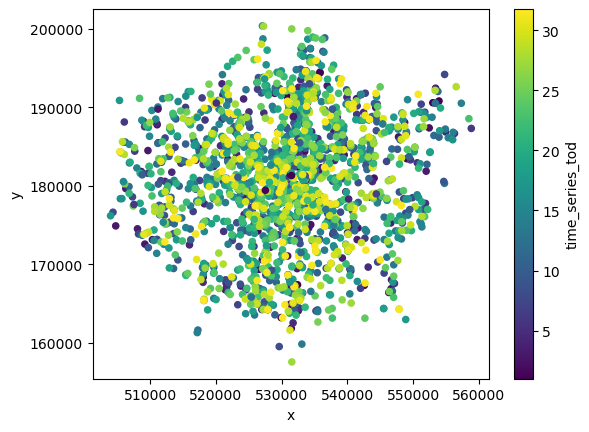

In [56]:
feb_2020.plot(kind = 'scatter', x = 'x', y = 'y', c='time_series_tod', cmap='viridis')
plt.show() 

In [57]:
# February 2021
# Hourly time series i.e. day 1: 0->23, day 2: 24->47, day 3: 48->71...
feb_2021['time_series'] = ((feb_2021.day - 1) * 23) + feb_2021.hour + (feb_2021.day - 1)

# Quarter-day time series i.e. Early morning (0-6) -> 0.0, morning (7-12) -> 0.25, afternoon (13-18) -> 0.50, evening (19-24) -> 0.75 to see if we can cluster more than 2
feb_2021["time_of_day"] = feb_2021['hour'].map(lambda x: 
                                                0 if x<=6 
                                                else 0.25 if x<=12  
                                                else 0.5 if x<=18 
                                                else 0.75)

feb_2021["time_series_tod"] = feb_2021.day + feb_2021.time_of_day
feb_2021[1500:1510] # sample for checking


,x,y,date,time,day,hour,time_series,time_of_day,time_series_tod


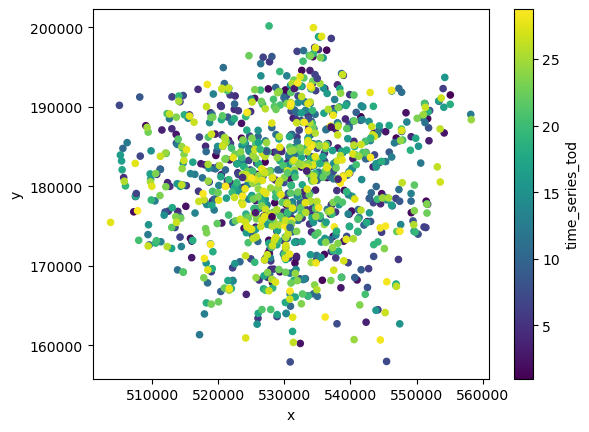

In [58]:
feb_2021.plot(kind = 'scatter', x = 'x', y = 'y', c='time_series_tod', cmap='viridis')
plt.show() 

In [59]:
# February 2022
# Hourly time series i.e. day 1: 0->23, day 2: 24->47, day 3: 48->71...
feb_2022['time_series'] = ((feb_2022.day - 1) * 23) + feb_2022.hour + (feb_2022.day - 1)

# Quarter-day time series i.e. Early morning (0-6) -> 0.0, morning (7-12) -> 0.25, afternoon (13-18) -> 0.50, evening (19-24) -> 0.75 to see if we can cluster more than 2
feb_2022["time_of_day"] = feb_2022['hour'].map(lambda x: 
                                                0 if x<=6 
                                                else 0.25 if x<=12  
                                                else 0.50 if x<=18 
                                                else 0.75)

feb_2022["time_series_tod"] = feb_2022.day + feb_2022.time_of_day
feb_2022[1500:1510] # sample for checking


,x,y,date,time,day,hour,time_series,time_of_day,time_series_tod
47529,531431,166873,2022-02-27,16:25,27,16,640,0.50,27.50
47530,524232,175432,2022-02-27,13:10,27,13,637,0.50,27.50
47531,512382,179364,2022-02-27,19:30,27,19,643,0.75,27.75
47532,507599,184833,2022-02-23,08:15,23,8,536,0.25,23.25
47533,522360,187163,2022-02-27,19:10,27,19,643,0.75,27.75
47534,515287,171307,2022-02-27,19:35,27,19,643,0.75,27.75
47535,524462,182360,2022-02-17,14:00,17,14,398,0.50,17.50
47536,528665,178684,2022-02-27,20:26,27,20,644,0.75,27.75
47537,520528,192232,2022-02-27,13:36,27,13,637,0.50,27.50
47538,523692,176984,2022-02-27,20:58,27,20,644,0.75,27.75


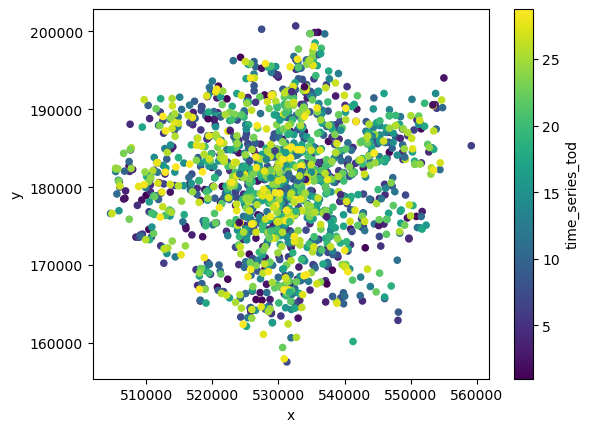

In [60]:
feb_2022.plot(kind = 'scatter', x = 'x', y = 'y', c='time_series_tod', cmap='viridis')
plt.show() 

<Axes: >

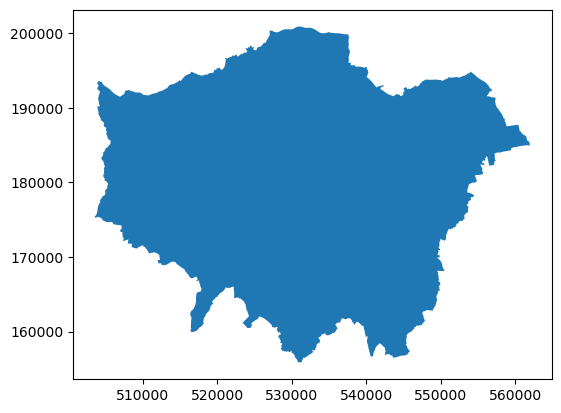

In [61]:
# Load the greater London boundary for context in visualisations
gla = gpd.read_file('./data/reference/gla_boundary/London_GLA_Boundary.shp')
gla.plot()

## 2. Model building and evaluation

### 2.1 Custom built ST-DBSCAN class to run a hyperparameter grid search, based on the ST_DBSCAN Python package. 
A custom Scikit-learn class that works with the Scikit-learn GridSearchCV was built (commented out) and ran well, but didn't seem to bring back the "best" parameters

In [62]:
## ********** NO LONGER USED, PLEASE SEE ABOVE**********

# # Adapted from the following two links:
# # Scikit-learn documentation: https://scikit-learn.org/stable/developers/develop.html (accessed 03/04/2025)
# # Spatial (only!) DBSCAN: https://medium.com/thedeephub/unraveling-patterns-in-spatio-temporal-data-the-power-of-st-dbscan-clustering-15d3cb129042 (accessed 03/04/2025)

# class CustomSTDBSCAN(BaseEstimator, ClusterMixin):
#     def __init__(self, eps1=0, eps2=0, min_samples=0):
#         self.eps1 = eps1
#         self.eps2 = eps2
#         self.min_samples = min_samples

#     def fit(self, X, y=None):
#         self.X_ = X
#         self.labels_ = self._fit_dbscan(X)
#         return self

#     def _fit_dbscan(self, X):
#         st_dbscan = ST_DBSCAN(eps1 = self.eps1, eps2 = self.eps2, min_samples = self.min_samples)
#         st_dbscan.fit(X) 
#         labels = st_dbscan.labels
        
#         return labels

# # Define silhouette scoring function(s) - this is used in the scikit-learn grid search
# def silhouette_scorer_hourly(estimator, X):
#     labels = estimator.fit_predict(X)
#     if len(set(labels)) > 1:
#         score = silhouette_score(X[['y', 'x', 'time_series']], labels)
#     else:
#         score = -1
    
#     print("Score------",score)

#     return score

# def silhouette_scorer_tod(estimator, X):
#     labels = estimator.fit_predict(X)
#     if len(set(labels)) > 1:
#         score = silhouette_score(X[['y', 'x', 'time_series_tod']], labels)
#     else:
#         score = -1
    
#     print("Score------",score)

#     return score

# def count_clusters(labels):
#     vc_df = pd.DataFrame({'cluster': labels})
#     print(vc_df.value_counts())

# def plot_results(X, labels, ts_column="time_series", hide_noise=False, title='ST-DBSCAN Clustering'):
#     X["cluster"] = labels
#     if hide_noise:
#         X = X[(X.cluster != -1)]
    
# # Plot results
# fig = plt.figure(figsize=(12, 6))
# ax = fig.add_subplot(111, projection='3d')
# scatter = ax.scatter(X['x'],X['y'], X[ts_column], c=X["cluster"], cmap='viridis', marker='o')
# legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
# ax.add_artist(legend1)
# ax.set_xlabel('Latitude')
# ax.set_ylabel('Longitude')
# ax.set_zlabel('Timestamp')
# ax.set_xlim([boundaries['x_min'], boundaries['x_max']])
# ax.set_ylim([boundaries['y_min'], boundaries['y_max']])
# plt.title(title)
# plt.show()

# # Interpretation
# n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
# n_noise = list(labels).count(-1)
# print(f'Estimated number of clusters: {n_clusters}')
# print(f'Estimated number of noise points: {n_noise}')

# if hide_noise:
#     print("\nData:")
#     print(X[["x","y","date","time","time_series","cluster"]])

## ********** NO LONGER USED, PLEASE SEE ABOVE**********

In [63]:
# Class that contains the functionality for running a grid search using the ST_DBSCAN Python library. 

class STDBSCAN():
    def __init__(self, p_grid, ts_column, boundaries):
        self.eps1 = p_grid['eps1']
        self.eps2 = p_grid['eps2']
        self.min_samples = p_grid['min_samples']
        self.ts_column = ts_column
        self.scores = {}
        self.X = None
        self.labels = None
        self.boundaries = boundaries

    def run_grid_search(self, X):
        self.X = X
        iterables = [self.eps1 , self.eps2, self.min_samples]
        x = 0

        for t in itertools.product(*iterables):
            silhouette_avg = 0

            st_dbscan = ST_DBSCAN(eps1 = t[0], eps2 = t[1], min_samples = t[2]) 
            st_dbscan.fit(X[['y','x',self.ts_column]]) 

            labels = st_dbscan.labels

            if len(set(labels)) > 1:
                silhouette_avg = silhouette_score(X[['y', 'x', self.ts_column]], labels)
            else:
                silhouette_avg = -1
                
            print(f"{t} - Silhouette Score: {silhouette_avg}")

            self.scores[t] = silhouette_avg

            x += 1
        
        print("Total completed: ", x)
        self.best_params = max(self.scores, key=self.scores.get)

        print(f"Best parameters: {self.best_params} with a score of {self.scores[self.best_params]}")
    
    def run_best_params(self):
        print(f"Running ST-DBSCAN for parameters: {self.best_params}")

        st_dbscan = ST_DBSCAN(eps1 = self.best_params[0], eps2 = self.best_params[1], min_samples = self.best_params[2]) 
        st_dbscan.fit(self.X[['y','x', self.ts_column]]) 

        self.bp_labels = st_dbscan.labels # best parameter labels

        self.get_cluster_count()

    def get_cluster_count(self):
        vc_df = pd.DataFrame({'cluster': self.bp_labels})
        print(vc_df.value_counts())

    def plot_results(self, hide_noise=False, title='ST-DBSCAN Clustering'):
        print(f"Results for ST-DBSCAN for parameters: {self.best_params}")
        x_tmp = self.X
        x_tmp["cluster"] = self.bp_labels
        if hide_noise:
            x_tmp = x_tmp[(x_tmp.cluster != -1)]
        
        # Plot results
        fig = plt.figure(figsize=(12, 6))
        ax = fig.add_subplot(111, projection='3d')
        scatter = ax.scatter(x_tmp['x'],x_tmp['y'], x_tmp[self.ts_column], c=x_tmp["cluster"], cmap='viridis', marker='o')
        legend1 = ax.legend(*scatter.legend_elements(), title="Clusters")
        ax.add_artist(legend1)
        ax.set_xlabel('Longitude')
        ax.set_ylabel('Latitude')
        ax.set_zlabel('Timestamp')
        ax.set_xlim([self.boundaries['x_min'], self.boundaries['x_max']])
        ax.set_ylim([self.boundaries['y_min'], self.boundaries['y_max']])
        plt.title(title)

        # Add greater London border for context
        gla_poly = Polygon(list(gla.get_coordinates().itertuples(index=False, name=None)))
        x,y = gla_poly.exterior.xy
        plt.plot(x,y)
        plt.show()

        # Interpretation
        n_clusters = len(set(self.bp_labels)) - (1 if -1 in self.bp_labels else 0)
        n_noise = list(self.bp_labels).count(-1)
        print(f'Estimated number of clusters: {n_clusters}')
        print(f'Estimated number of noise points: {n_noise}')

        if hide_noise:
            print("\nData:")
            print(x_tmp[["x","y","date","time","time_series","cluster"]])

    


### 2.2 Parameter grids for hyperparameter tuning

In [64]:
# Build 2 parameter grids, defining the parameters to use in hyperparameter grid-search
# [1 of 2] -> min_samples = 2

# epsilon1 - The spatial density threshold (maximum spatial distance) between two points to be considered related.
epsilon1 = [e1 for e1 in range(1000, 11000, 1000)]

# epsilon2 - The temporal threshold (maximum temporal distance) between two points to be considered related.
epsilon2 = [e2 for e2 in range(1, 11, 1)]

# min_samples - The number of samples required for a core point.
min_samples = [s for s in range(2, 5, 1)]

param_grid_min_2 = {
    'eps1': epsilon1,
    'eps2': epsilon2,
    'min_samples':min_samples
}
print(len(param_grid_min_2['eps1']), len(param_grid_min_2['eps2']), len(param_grid_min_2['min_samples']))
print("Total combinations = ", len(param_grid_min_2['eps1']) * len(param_grid_min_2['eps2']) * len(param_grid_min_2['min_samples']))

param_grid_min_2

10 10 3
Total combinations =  300


{'eps1': [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000],
 'eps2': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'min_samples': [2, 3, 4]}

In [65]:
# Build 2 parameter grids, defining the parameters to use in hyperparameter grid-search
# [2 of 2] -> min_samples = 3

# epsilon1 - The spatial density threshold (maximum spatial distance) between two points to be considered related.
epsilon1 = [e1 for e1 in range(1000, 11000, 1000)]

# epsilon2 - The temporal threshold (maximum temporal distance) between two points to be considered related.
epsilon2 = [e2 for e2 in range(1, 11, 1)]

# min_samples - The number of samples required for a core point.
min_samples = [s for s in range(3, 6, 1)]

param_grid_min_3 = {
    'eps1': epsilon1,
    'eps2': epsilon2,
    'min_samples':min_samples
}
print(len(param_grid_min_3['eps1']), len(param_grid_min_3['eps2']), len(param_grid_min_3['min_samples']))
print("Total combinations = ", len(param_grid_min_3['eps1']) * len(param_grid_min_3['eps2']) * len(param_grid_min_3['min_samples']))

param_grid_min_3

10 10 3
Total combinations =  300


{'eps1': [1000, 2000, 3000, 4000, 5000, 6000, 7000, 8000, 9000, 10000],
 'eps2': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
 'min_samples': [3, 4, 5]}

### 2.3 **Hourly** Spatio-temporal clustering of February 2020
The models are run using time values aggregated to the hour, modifying the minimum grid search value for "minimum_samples" from 3 to 2, to check the impact on clustering 

*minimum_samples = 3*

(1000, 1, 3) - Silhouette Score: -0.3778350981393963
(1000, 1, 4) - Silhouette Score: -1
(1000, 1, 5) - Silhouette Score: -1
(1000, 2, 3) - Silhouette Score: -0.3778350981393963
(1000, 2, 4) - Silhouette Score: -1
(1000, 2, 5) - Silhouette Score: -1
(1000, 3, 3) - Silhouette Score: -0.5450326396786156
(1000, 3, 4) - Silhouette Score: -0.18140451568520366
(1000, 3, 5) - Silhouette Score: -1
(1000, 4, 3) - Silhouette Score: -0.6095426446360133
(1000, 4, 4) - Silhouette Score: -0.18140451568520366
(1000, 4, 5) - Silhouette Score: -0.17966890776041264
(1000, 5, 3) - Silhouette Score: -0.6150481002404877
(1000, 5, 4) - Silhouette Score: -0.18140451568520366
(1000, 5, 5) - Silhouette Score: -0.18140451568520366
(1000, 6, 3) - Silhouette Score: -0.6386639018794223
(1000, 6, 4) - Silhouette Score: -0.18140451568520366
(1000, 6, 5) - Silhouette Score: -0.18140451568520366
(1000, 7, 3) - Silhouette Score: -0.6704672560665241
(1000, 7, 4) - Silhouette Score: -0.4616470123284161
(1000, 7, 5) - Sil

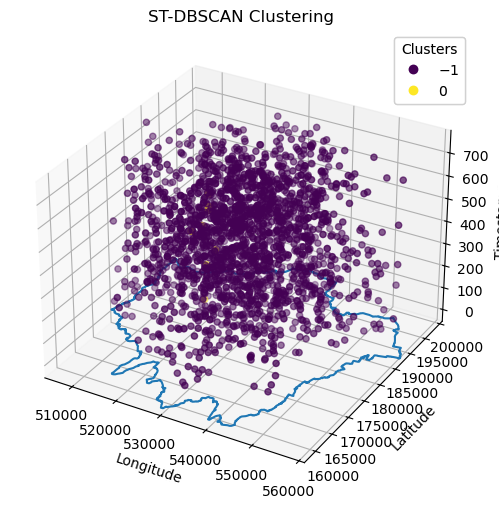

Estimated number of clusters: 1
Estimated number of noise points: 1939
Results for ST-DBSCAN for parameters: (4000, 3, 4)


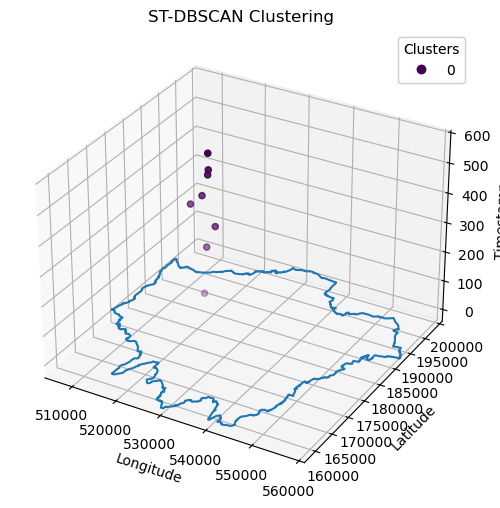

Estimated number of clusters: 1
Estimated number of noise points: 1939

Data:
           x       y       date   time  time_series  cluster
157   521701  180089 2020-01-04  19:50           91        0
484   522300  180086 2020-01-11  12:54          252        0
659   524295  180078 2020-01-14  18:55          330        0
838   518701  180078 2020-01-16  22:45          382        0
953   521341  180089 2020-01-18  13:15          421        0
1138  522672  180081 2020-01-21  15:10          495        0
1173  522809  180082 2020-01-22  08:33          512        0
1328  522732  180083 2020-01-24  14:25          566        0


In [66]:
stdbscan_feb_2020_3 = STDBSCAN(param_grid_min_3, 'time_series', boundaries)
stdbscan_feb_2020_3.run_grid_search(feb_2020)
stdbscan_feb_2020_3.run_best_params()
stdbscan_feb_2020_3.plot_results(hide_noise=False)
stdbscan_feb_2020_3.plot_results(hide_noise=True)

*minimum_samples = 2*

(1000, 1, 2) - Silhouette Score: -0.7410049281003196
(1000, 1, 3) - Silhouette Score: -0.3778350981393963
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.7521771735126693
(1000, 2, 3) - Silhouette Score: -0.3778350981393963
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7445168848068499
(1000, 3, 3) - Silhouette Score: -0.5450326396786156
(1000, 3, 4) - Silhouette Score: -0.18140451568520366
(1000, 4, 2) - Silhouette Score: -0.7443345500189146
(1000, 4, 3) - Silhouette Score: -0.6095426446360133
(1000, 4, 4) - Silhouette Score: -0.18140451568520366
(1000, 5, 2) - Silhouette Score: -0.739388244330992
(1000, 5, 3) - Silhouette Score: -0.6150481002404877
(1000, 5, 4) - Silhouette Score: -0.18140451568520366
(1000, 6, 2) - Silhouette Score: -0.7290730387815344
(1000, 6, 3) - Silhouette Score: -0.6386639018794223
(1000, 6, 4) - Silhouette Score: -0.18140451568520366
(1000, 7, 2) - Silhouette Score: -0.716243804405766
(1000, 7, 3) - Silhouette

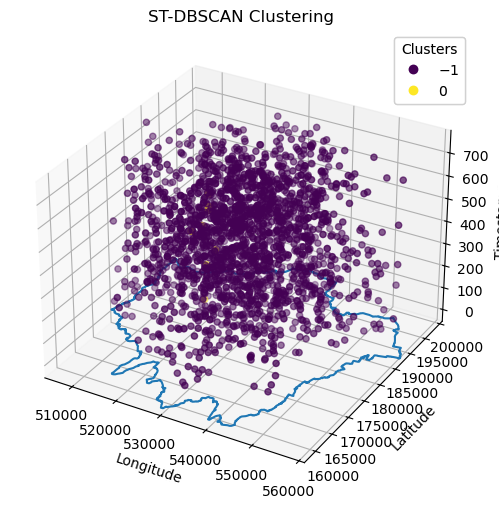

Estimated number of clusters: 1
Estimated number of noise points: 1939
Results for ST-DBSCAN for parameters: (4000, 3, 4)


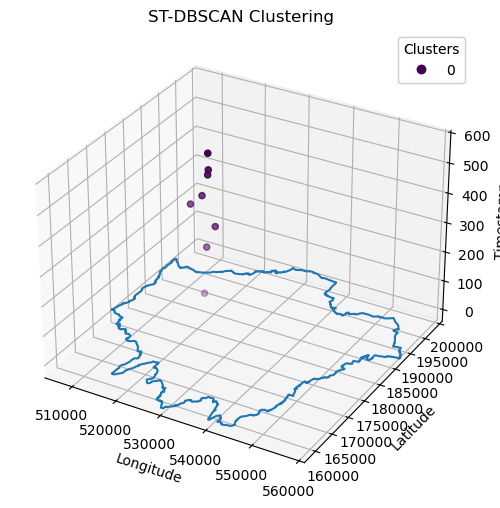

Estimated number of clusters: 1
Estimated number of noise points: 1939

Data:
           x       y       date   time  time_series  cluster
157   521701  180089 2020-01-04  19:50           91        0
484   522300  180086 2020-01-11  12:54          252        0
659   524295  180078 2020-01-14  18:55          330        0
838   518701  180078 2020-01-16  22:45          382        0
953   521341  180089 2020-01-18  13:15          421        0
1138  522672  180081 2020-01-21  15:10          495        0
1173  522809  180082 2020-01-22  08:33          512        0
1328  522732  180083 2020-01-24  14:25          566        0


In [67]:
stdbscan_feb_2020_2 = STDBSCAN(param_grid_min_2, 'time_series', boundaries)
stdbscan_feb_2020_2.run_grid_search(feb_2020)
stdbscan_feb_2020_2.run_best_params()
stdbscan_feb_2020_2.plot_results(hide_noise=False)
stdbscan_feb_2020_2.plot_results(hide_noise=True)

### 2.4 **Quarter-daily** Spatio-temporal clustering of February 2020
The models are run using time values aggregated to a quarter of a day, modifying the minimum grid search value for "minimum_samples" from 3 to 2, to check the impact on clustering m

*minimum_samples = 3*

(1000, 1, 3) - Silhouette Score: -0.3781324579151742
(1000, 1, 4) - Silhouette Score: -1
(1000, 1, 5) - Silhouette Score: -1
(1000, 2, 3) - Silhouette Score: -0.3781324579151742
(1000, 2, 4) - Silhouette Score: -1
(1000, 2, 5) - Silhouette Score: -1
(1000, 3, 3) - Silhouette Score: -0.5455157850242643
(1000, 3, 4) - Silhouette Score: -0.1814496873573748
(1000, 3, 5) - Silhouette Score: -1
(1000, 4, 3) - Silhouette Score: -0.6100772381617431
(1000, 4, 4) - Silhouette Score: -0.1814496873573748
(1000, 4, 5) - Silhouette Score: -0.1797295216578514
(1000, 5, 3) - Silhouette Score: -0.6155703658079983
(1000, 5, 4) - Silhouette Score: -0.1814496873573748
(1000, 5, 5) - Silhouette Score: -0.1814496873573748
(1000, 6, 3) - Silhouette Score: -0.6521465873575449
(1000, 6, 4) - Silhouette Score: -0.1814496873573748
(1000, 6, 5) - Silhouette Score: -0.1814496873573748
(1000, 7, 3) - Silhouette Score: -0.67083937510963
(1000, 7, 4) - Silhouette Score: -0.4618828219400511
(1000, 7, 5) - Silhouette S

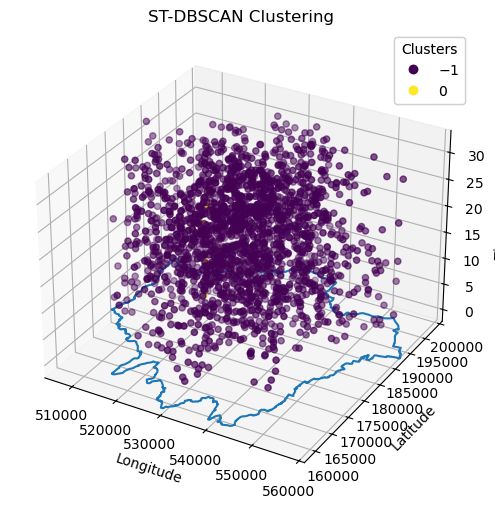

Estimated number of clusters: 1
Estimated number of noise points: 1939
Results for ST-DBSCAN for parameters: (4000, 3, 4)


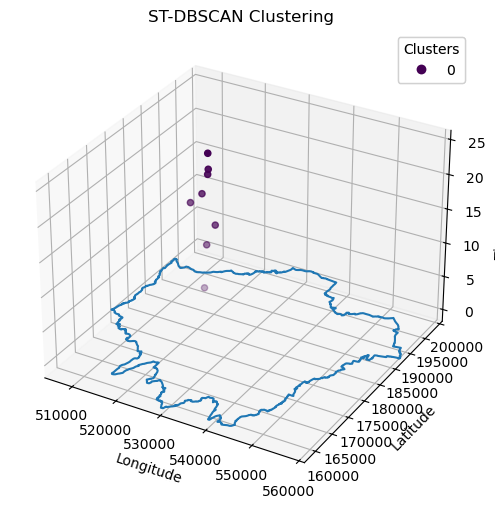

Estimated number of clusters: 1
Estimated number of noise points: 1939

Data:
           x       y       date   time  time_series  cluster
157   521701  180089 2020-01-04  19:50           91        0
484   522300  180086 2020-01-11  12:54          252        0
659   524295  180078 2020-01-14  18:55          330        0
838   518701  180078 2020-01-16  22:45          382        0
953   521341  180089 2020-01-18  13:15          421        0
1138  522672  180081 2020-01-21  15:10          495        0
1173  522809  180082 2020-01-22  08:33          512        0
1328  522732  180083 2020-01-24  14:25          566        0


In [68]:
stdbscan_feb_2020_3 = STDBSCAN(param_grid_min_3, 'time_series_tod', boundaries)
stdbscan_feb_2020_3.run_grid_search(feb_2020)
stdbscan_feb_2020_3.run_best_params()
stdbscan_feb_2020_3.plot_results(hide_noise=False)
stdbscan_feb_2020_3.plot_results(hide_noise=True)

*minimum_samples = 2*

(1000, 1, 2) - Silhouette Score: -0.7420311079814308
(1000, 1, 3) - Silhouette Score: -0.3781324579151742
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.7495622705631061
(1000, 2, 3) - Silhouette Score: -0.3781324579151742
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7403108977074968
(1000, 3, 3) - Silhouette Score: -0.5455157850242643
(1000, 3, 4) - Silhouette Score: -0.1814496873573748
(1000, 4, 2) - Silhouette Score: -0.7384658925865653
(1000, 4, 3) - Silhouette Score: -0.6100772381617431
(1000, 4, 4) - Silhouette Score: -0.1814496873573748
(1000, 5, 2) - Silhouette Score: -0.7310921757942422
(1000, 5, 3) - Silhouette Score: -0.6155703658079983
(1000, 5, 4) - Silhouette Score: -0.1814496873573748
(1000, 6, 2) - Silhouette Score: -0.7203393122100851
(1000, 6, 3) - Silhouette Score: -0.6521465873575449
(1000, 6, 4) - Silhouette Score: -0.1814496873573748
(1000, 7, 2) - Silhouette Score: -0.7078770890047925
(1000, 7, 3) - Silhouette S

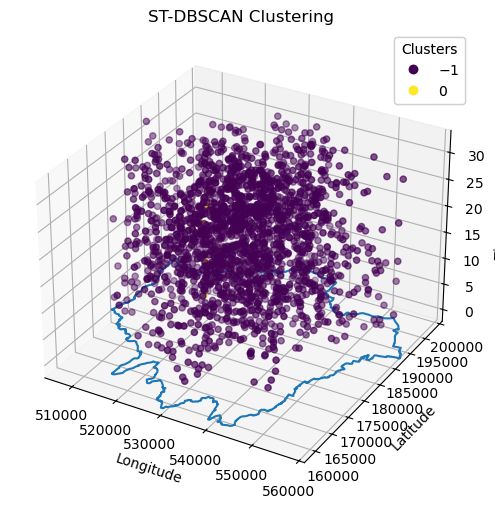

Estimated number of clusters: 1
Estimated number of noise points: 1939
Results for ST-DBSCAN for parameters: (4000, 3, 4)


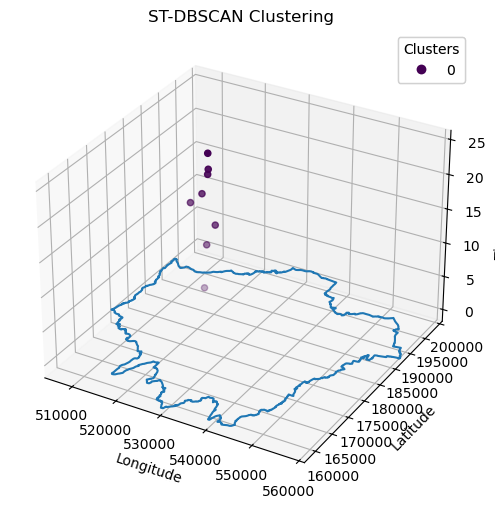

Estimated number of clusters: 1
Estimated number of noise points: 1939

Data:
           x       y       date   time  time_series  cluster
157   521701  180089 2020-01-04  19:50           91        0
484   522300  180086 2020-01-11  12:54          252        0
659   524295  180078 2020-01-14  18:55          330        0
838   518701  180078 2020-01-16  22:45          382        0
953   521341  180089 2020-01-18  13:15          421        0
1138  522672  180081 2020-01-21  15:10          495        0
1173  522809  180082 2020-01-22  08:33          512        0
1328  522732  180083 2020-01-24  14:25          566        0


In [69]:
stdbscan_feb_2020_2 = STDBSCAN(param_grid_min_2, 'time_series_tod', boundaries)
stdbscan_feb_2020_2.run_grid_search(feb_2020)
stdbscan_feb_2020_2.run_best_params()
stdbscan_feb_2020_2.plot_results(hide_noise=False)
stdbscan_feb_2020_2.plot_results(hide_noise=True)

### 2.5 **Hourly** Spatio-temporal clustering of February 2021
The models are run using time values aggregated to the hour, modifying the minimum grid search value for "minimum_samples" from 3 to 2, to check the impact on clustering 

*minimum_samples = 3*

(1000, 1, 3) - Silhouette Score: -1
(1000, 1, 4) - Silhouette Score: -1
(1000, 1, 5) - Silhouette Score: -1
(1000, 2, 3) - Silhouette Score: -1
(1000, 2, 4) - Silhouette Score: -1
(1000, 2, 5) - Silhouette Score: -1
(1000, 3, 3) - Silhouette Score: -1
(1000, 3, 4) - Silhouette Score: -1
(1000, 3, 5) - Silhouette Score: -1
(1000, 4, 3) - Silhouette Score: -0.23106624254984814
(1000, 4, 4) - Silhouette Score: -1
(1000, 4, 5) - Silhouette Score: -1
(1000, 5, 3) - Silhouette Score: -0.23106624254984814
(1000, 5, 4) - Silhouette Score: -1
(1000, 5, 5) - Silhouette Score: -1
(1000, 6, 3) - Silhouette Score: -0.23106624254984814
(1000, 6, 4) - Silhouette Score: -1
(1000, 6, 5) - Silhouette Score: -1
(1000, 7, 3) - Silhouette Score: -0.2710812873501514
(1000, 7, 4) - Silhouette Score: -1
(1000, 7, 5) - Silhouette Score: -1
(1000, 8, 3) - Silhouette Score: -0.2710812873501514
(1000, 8, 4) - Silhouette Score: -1
(1000, 8, 5) - Silhouette Score: -1
(1000, 9, 3) - Silhouette Score: -0.271081287350

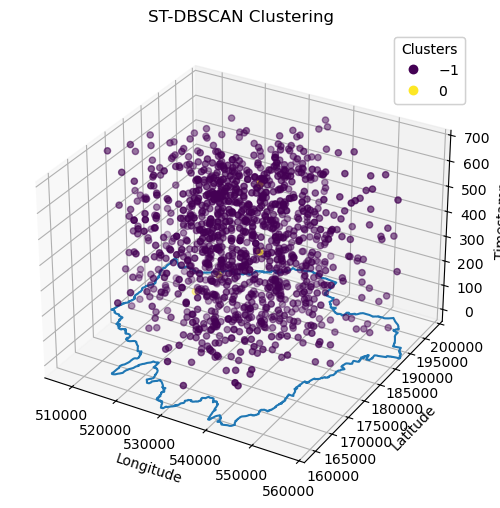

Estimated number of clusters: 1
Estimated number of noise points: 1180
Results for ST-DBSCAN for parameters: (10000, 3, 4)


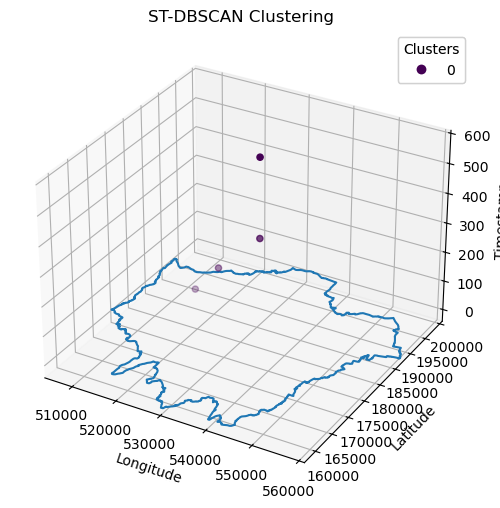

Estimated number of clusters: 1
Estimated number of noise points: 1180

Data:
            x       y       date   time  time_series  cluster
22282  517366  182859 2021-02-03  10:53           58        0
22478  522803  182859 2021-02-07  12:40          156        0
22679  532226  182856 2021-02-13  10:30          298        0
23744  532216  182860 2021-02-24  16:30          568        0


In [70]:
stdbscan_feb_2021_3 = STDBSCAN(param_grid_min_3, 'time_series', boundaries)
stdbscan_feb_2021_3.run_grid_search(feb_2021)
stdbscan_feb_2021_3.run_best_params()
stdbscan_feb_2021_3.plot_results(hide_noise=False)
stdbscan_feb_2021_3.plot_results(hide_noise=True)

*minimum_samples = 2*

(1000, 1, 2) - Silhouette Score: -0.6782872903276672
(1000, 1, 3) - Silhouette Score: -1
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.6954194874320726
(1000, 2, 3) - Silhouette Score: -1
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7077134359155526
(1000, 3, 3) - Silhouette Score: -1
(1000, 3, 4) - Silhouette Score: -1
(1000, 4, 2) - Silhouette Score: -0.7102882316990016
(1000, 4, 3) - Silhouette Score: -0.23106624254984814
(1000, 4, 4) - Silhouette Score: -1
(1000, 5, 2) - Silhouette Score: -0.7050232297653214
(1000, 5, 3) - Silhouette Score: -0.23106624254984814
(1000, 5, 4) - Silhouette Score: -1
(1000, 6, 2) - Silhouette Score: -0.7134579779423128
(1000, 6, 3) - Silhouette Score: -0.23106624254984814
(1000, 6, 4) - Silhouette Score: -1
(1000, 7, 2) - Silhouette Score: -0.7110048850297406
(1000, 7, 3) - Silhouette Score: -0.2710812873501514
(1000, 7, 4) - Silhouette Score: -1
(1000, 8, 2) - Silhouette Score: -0.7040579756810832
(

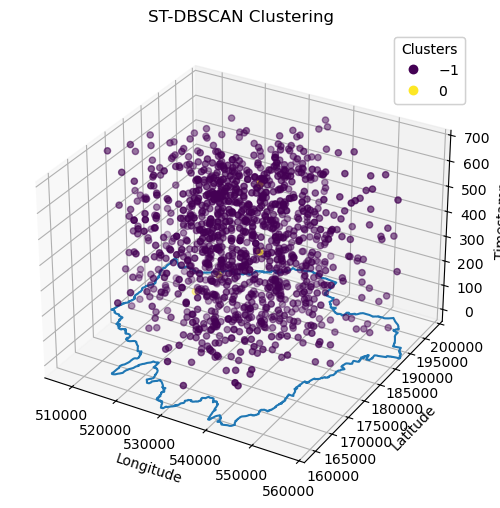

Estimated number of clusters: 1
Estimated number of noise points: 1180
Results for ST-DBSCAN for parameters: (10000, 3, 4)


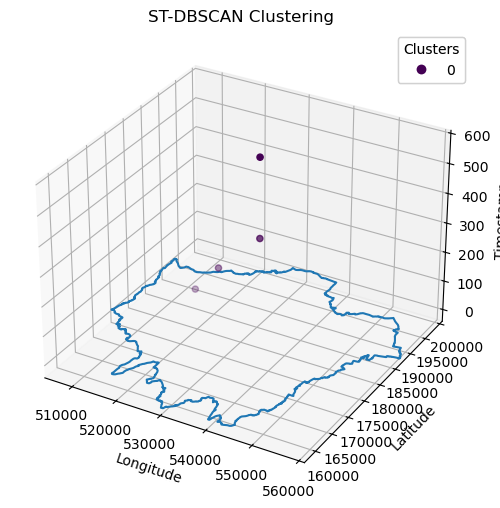

Estimated number of clusters: 1
Estimated number of noise points: 1180

Data:
            x       y       date   time  time_series  cluster
22282  517366  182859 2021-02-03  10:53           58        0
22478  522803  182859 2021-02-07  12:40          156        0
22679  532226  182856 2021-02-13  10:30          298        0
23744  532216  182860 2021-02-24  16:30          568        0


In [71]:
stdbscan_feb_2021_2 = STDBSCAN(param_grid_min_2, 'time_series', boundaries)
stdbscan_feb_2021_2.run_grid_search(feb_2021)
stdbscan_feb_2021_2.run_best_params()
stdbscan_feb_2021_2.plot_results(hide_noise=False)
stdbscan_feb_2021_2.plot_results(hide_noise=True)

### 2.6 **Quarter-daily** Spatio-temporal clustering of February 2021
The models are run using time values aggregated to a quarter of a day, modifying the minimum grid search value for "minimum_samples" from 3 to 2, to check the impact on clustering 



*minimum_samples = 3*

(1000, 1, 3) - Silhouette Score: -1
(1000, 1, 4) - Silhouette Score: -1
(1000, 1, 5) - Silhouette Score: -1
(1000, 2, 3) - Silhouette Score: -1
(1000, 2, 4) - Silhouette Score: -1
(1000, 2, 5) - Silhouette Score: -1
(1000, 3, 3) - Silhouette Score: -1
(1000, 3, 4) - Silhouette Score: -1
(1000, 3, 5) - Silhouette Score: -1
(1000, 4, 3) - Silhouette Score: -0.2311533224562985
(1000, 4, 4) - Silhouette Score: -1
(1000, 4, 5) - Silhouette Score: -1
(1000, 5, 3) - Silhouette Score: -0.2311533224562985
(1000, 5, 4) - Silhouette Score: -1
(1000, 5, 5) - Silhouette Score: -1
(1000, 6, 3) - Silhouette Score: -0.2311533224562985
(1000, 6, 4) - Silhouette Score: -1
(1000, 6, 5) - Silhouette Score: -1
(1000, 7, 3) - Silhouette Score: -0.2711322183638808
(1000, 7, 4) - Silhouette Score: -1
(1000, 7, 5) - Silhouette Score: -1
(1000, 8, 3) - Silhouette Score: -0.2711322183638808
(1000, 8, 4) - Silhouette Score: -1
(1000, 8, 5) - Silhouette Score: -1
(1000, 9, 3) - Silhouette Score: -0.271132218363880

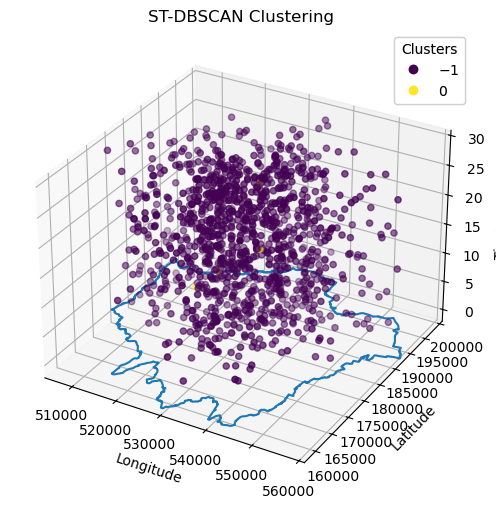

Estimated number of clusters: 1
Estimated number of noise points: 1180
Results for ST-DBSCAN for parameters: (10000, 3, 4)


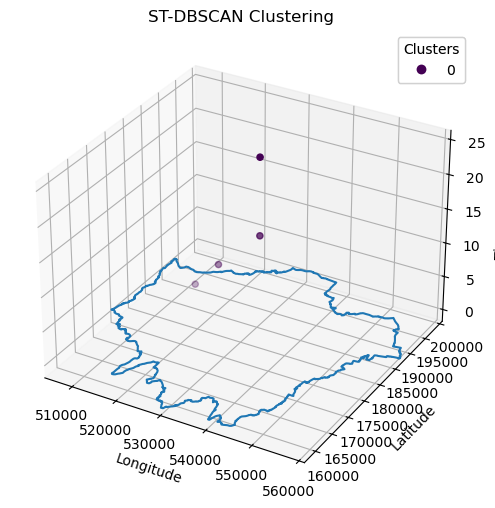

Estimated number of clusters: 1
Estimated number of noise points: 1180

Data:
            x       y       date   time  time_series  cluster
22282  517366  182859 2021-02-03  10:53           58        0
22478  522803  182859 2021-02-07  12:40          156        0
22679  532226  182856 2021-02-13  10:30          298        0
23744  532216  182860 2021-02-24  16:30          568        0


In [72]:
stdbscan_feb_2021_3 = STDBSCAN(param_grid_min_3, 'time_series_tod', boundaries)
stdbscan_feb_2021_3.run_grid_search(feb_2021)
stdbscan_feb_2021_3.run_best_params()
stdbscan_feb_2021_3.plot_results(hide_noise=False)
stdbscan_feb_2021_3.plot_results(hide_noise=True)

*minimum_samples = 2*

(1000, 1, 2) - Silhouette Score: -0.6782349999965915
(1000, 1, 3) - Silhouette Score: -1
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.6933316756000734
(1000, 2, 3) - Silhouette Score: -1
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7041860485937764
(1000, 3, 3) - Silhouette Score: -1
(1000, 3, 4) - Silhouette Score: -1
(1000, 4, 2) - Silhouette Score: -0.7058524592529453
(1000, 4, 3) - Silhouette Score: -0.2311533224562985
(1000, 4, 4) - Silhouette Score: -1
(1000, 5, 2) - Silhouette Score: -0.7002971529297052
(1000, 5, 3) - Silhouette Score: -0.2311533224562985
(1000, 5, 4) - Silhouette Score: -1
(1000, 6, 2) - Silhouette Score: -0.7075979430970971
(1000, 6, 3) - Silhouette Score: -0.2311533224562985
(1000, 6, 4) - Silhouette Score: -1
(1000, 7, 2) - Silhouette Score: -0.7047958495756418
(1000, 7, 3) - Silhouette Score: -0.2711322183638808
(1000, 7, 4) - Silhouette Score: -1
(1000, 8, 2) - Silhouette Score: -0.6966729556174418
(100

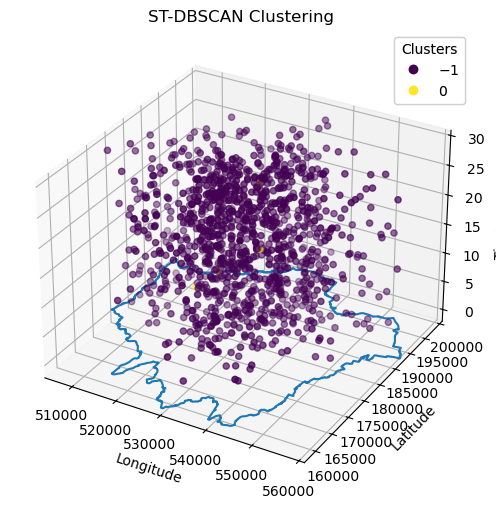

Estimated number of clusters: 1
Estimated number of noise points: 1180
Results for ST-DBSCAN for parameters: (10000, 3, 4)


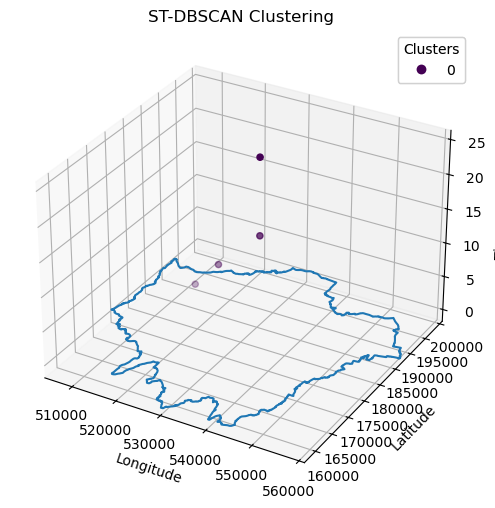

Estimated number of clusters: 1
Estimated number of noise points: 1180

Data:
            x       y       date   time  time_series  cluster
22282  517366  182859 2021-02-03  10:53           58        0
22478  522803  182859 2021-02-07  12:40          156        0
22679  532226  182856 2021-02-13  10:30          298        0
23744  532216  182860 2021-02-24  16:30          568        0


In [73]:
stdbscan_feb_2021_2 = STDBSCAN(param_grid_min_2, 'time_series_tod', boundaries)
stdbscan_feb_2021_2.run_grid_search(feb_2021)
stdbscan_feb_2021_2.run_best_params()
stdbscan_feb_2021_2.plot_results(hide_noise=False)
stdbscan_feb_2021_2.plot_results(hide_noise=True)

### 2.7 **Hourly** Spatio-temporal clustering of February 2022
The models are run using time values aggregated to the hour, modifying the minimum grid search value for "minimum_samples" from 3 to 2, to check the impact on clustering 

*minimum_samples = 3*

(1000, 1, 3) - Silhouette Score: -0.30149849744898166
(1000, 1, 4) - Silhouette Score: -1
(1000, 1, 5) - Silhouette Score: -1
(1000, 2, 3) - Silhouette Score: -0.3422718987507111
(1000, 2, 4) - Silhouette Score: -1
(1000, 2, 5) - Silhouette Score: -1
(1000, 3, 3) - Silhouette Score: -0.3422718987507111
(1000, 3, 4) - Silhouette Score: -1
(1000, 3, 5) - Silhouette Score: -1
(1000, 4, 3) - Silhouette Score: -0.37348370422609933
(1000, 4, 4) - Silhouette Score: -1
(1000, 4, 5) - Silhouette Score: -1
(1000, 5, 3) - Silhouette Score: -0.48518317591047366
(1000, 5, 4) - Silhouette Score: -1
(1000, 5, 5) - Silhouette Score: -1
(1000, 6, 3) - Silhouette Score: -0.48518317591047366
(1000, 6, 4) - Silhouette Score: -1
(1000, 6, 5) - Silhouette Score: -1
(1000, 7, 3) - Silhouette Score: -0.5999003983862378
(1000, 7, 4) - Silhouette Score: -1
(1000, 7, 5) - Silhouette Score: -1
(1000, 8, 3) - Silhouette Score: -0.6166011722117678
(1000, 8, 4) - Silhouette Score: -0.27592013557514355
(1000, 8, 5) -

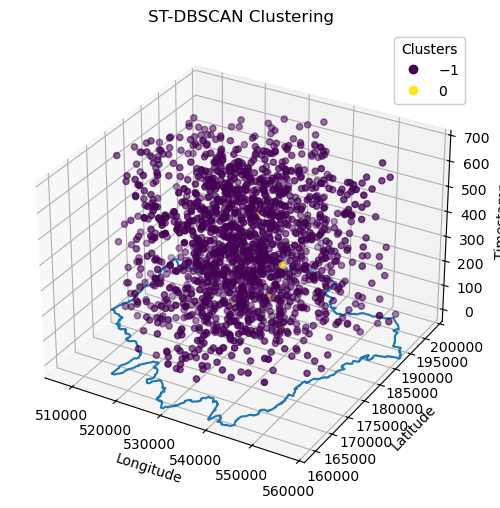

Estimated number of clusters: 1
Estimated number of noise points: 1660
Results for ST-DBSCAN for parameters: (3000, 2, 4)


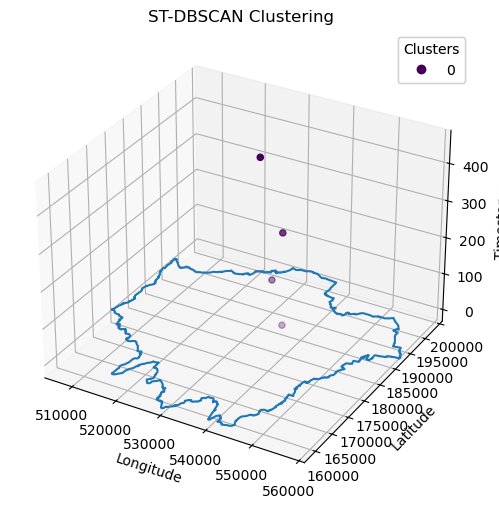

Estimated number of clusters: 1
Estimated number of noise points: 1660

Data:
            x       y       date   time  time_series  cluster
46024  537298  182839 2022-02-01  18:35           18        0
46328  534979  182841 2022-02-06  15:20          135        0
46672  537333  182841 2022-02-12  07:46          271        0
47205  532275  182841 2022-02-19  22:42          454        0


In [74]:
stdbscan_feb_2022_3 = STDBSCAN(param_grid_min_3, 'time_series', boundaries)
stdbscan_feb_2022_3.run_grid_search(feb_2022)
stdbscan_feb_2022_3.run_best_params()
stdbscan_feb_2022_3.plot_results(hide_noise=False)
stdbscan_feb_2022_3.plot_results(hide_noise=True)

*minimum_samples = 2*

(1000, 1, 2) - Silhouette Score: -0.7035208770564487
(1000, 1, 3) - Silhouette Score: -0.30149849744898166
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.7031967810042725
(1000, 2, 3) - Silhouette Score: -0.3422718987507111
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7372744566775644
(1000, 3, 3) - Silhouette Score: -0.3422718987507111
(1000, 3, 4) - Silhouette Score: -1
(1000, 4, 2) - Silhouette Score: -0.7365401761845407
(1000, 4, 3) - Silhouette Score: -0.37348370422609933
(1000, 4, 4) - Silhouette Score: -1
(1000, 5, 2) - Silhouette Score: -0.7379808108335565
(1000, 5, 3) - Silhouette Score: -0.48518317591047366
(1000, 5, 4) - Silhouette Score: -1
(1000, 6, 2) - Silhouette Score: -0.7324742567656267
(1000, 6, 3) - Silhouette Score: -0.48518317591047366
(1000, 6, 4) - Silhouette Score: -1
(1000, 7, 2) - Silhouette Score: -0.7221949053925277
(1000, 7, 3) - Silhouette Score: -0.5999003983862378
(1000, 7, 4) - Silhouette Score: -1
(1

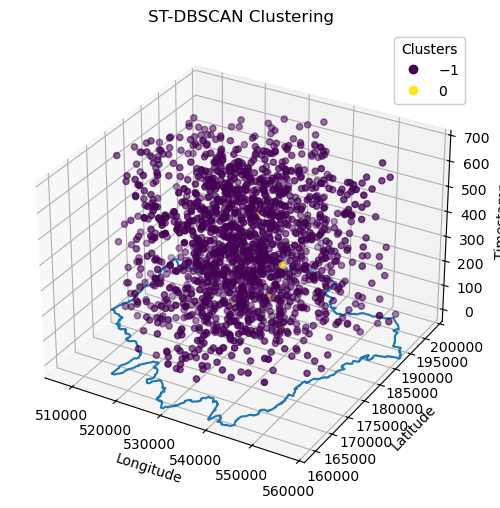

Estimated number of clusters: 1
Estimated number of noise points: 1660
Results for ST-DBSCAN for parameters: (3000, 2, 4)


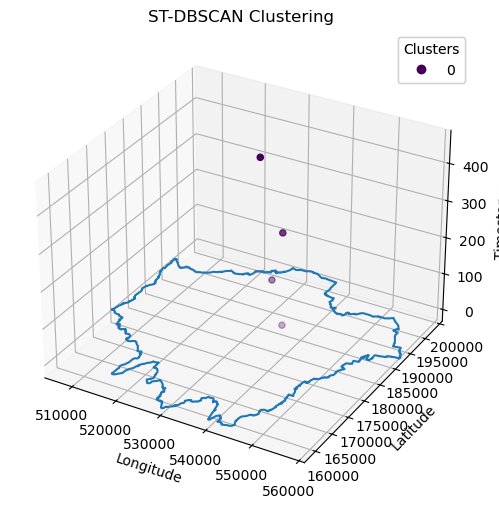

Estimated number of clusters: 1
Estimated number of noise points: 1660

Data:
            x       y       date   time  time_series  cluster
46024  537298  182839 2022-02-01  18:35           18        0
46328  534979  182841 2022-02-06  15:20          135        0
46672  537333  182841 2022-02-12  07:46          271        0
47205  532275  182841 2022-02-19  22:42          454        0


In [75]:
stdbscan_feb_2022_2 = STDBSCAN(param_grid_min_2, 'time_series', boundaries)
stdbscan_feb_2022_2.run_grid_search(feb_2022)
stdbscan_feb_2022_2.run_best_params()
stdbscan_feb_2022_2.plot_results(hide_noise=False)
stdbscan_feb_2022_2.plot_results(hide_noise=True)

### 2.8 **Quarter-daily** Spatio-temporal clustering of February 2022
The models are run using time values aggregated to a quarter of a day, modifying the minimum grid search value for "minimum_samples" from 3 to 2, to check the impact on clustering 

*minimum_samples = 3*

(1000, 1, 3) - Silhouette Score: -0.3016653804149562
(1000, 1, 4) - Silhouette Score: -1
(1000, 1, 5) - Silhouette Score: -1
(1000, 2, 3) - Silhouette Score: -0.3424842414670861
(1000, 2, 4) - Silhouette Score: -1
(1000, 2, 5) - Silhouette Score: -1
(1000, 3, 3) - Silhouette Score: -0.3424842414670861
(1000, 3, 4) - Silhouette Score: -1
(1000, 3, 5) - Silhouette Score: -1
(1000, 4, 3) - Silhouette Score: -0.3737604959619007
(1000, 4, 4) - Silhouette Score: -1
(1000, 4, 5) - Silhouette Score: -1
(1000, 5, 3) - Silhouette Score: -0.485575978668306
(1000, 5, 4) - Silhouette Score: -1
(1000, 5, 5) - Silhouette Score: -1
(1000, 6, 3) - Silhouette Score: -0.485575978668306
(1000, 6, 4) - Silhouette Score: -1
(1000, 6, 5) - Silhouette Score: -1
(1000, 7, 3) - Silhouette Score: -0.6003204304498013
(1000, 7, 4) - Silhouette Score: -1
(1000, 7, 5) - Silhouette Score: -1
(1000, 8, 3) - Silhouette Score: -0.6171454291636226
(1000, 8, 4) - Silhouette Score: -0.2762666926360958
(1000, 8, 5) - Silhou

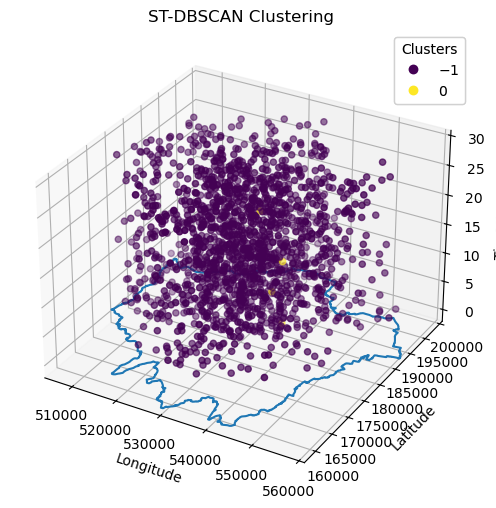

Estimated number of clusters: 1
Estimated number of noise points: 1660
Results for ST-DBSCAN for parameters: (3000, 2, 4)


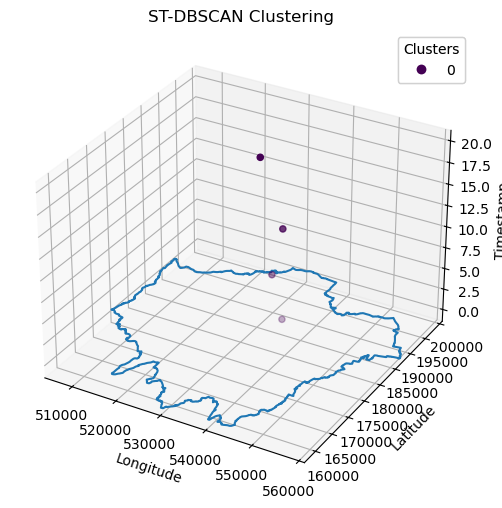

Estimated number of clusters: 1
Estimated number of noise points: 1660

Data:
            x       y       date   time  time_series  cluster
46024  537298  182839 2022-02-01  18:35           18        0
46328  534979  182841 2022-02-06  15:20          135        0
46672  537333  182841 2022-02-12  07:46          271        0
47205  532275  182841 2022-02-19  22:42          454        0


In [76]:
stdbscan_feb_2022_3 = STDBSCAN(param_grid_min_3, 'time_series_tod', boundaries)
stdbscan_feb_2022_3.run_grid_search(feb_2022)
stdbscan_feb_2022_3.run_best_params()
stdbscan_feb_2022_3.plot_results(hide_noise=False)
stdbscan_feb_2022_3.plot_results(hide_noise=True)

*minimum_samples = 2*


(1000, 1, 2) - Silhouette Score: -0.7025998255504018
(1000, 1, 3) - Silhouette Score: -0.3016653804149562
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.7005094809540737
(1000, 2, 3) - Silhouette Score: -0.3424842414670861
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7339751504662575
(1000, 3, 3) - Silhouette Score: -0.3424842414670861
(1000, 3, 4) - Silhouette Score: -1
(1000, 4, 2) - Silhouette Score: -0.7313768316782685
(1000, 4, 3) - Silhouette Score: -0.3737604959619007
(1000, 4, 4) - Silhouette Score: -1
(1000, 5, 2) - Silhouette Score: -0.7325271267950471
(1000, 5, 3) - Silhouette Score: -0.485575978668306
(1000, 5, 4) - Silhouette Score: -1
(1000, 6, 2) - Silhouette Score: -0.7258410631182427
(1000, 6, 3) - Silhouette Score: -0.485575978668306
(1000, 6, 4) - Silhouette Score: -1
(1000, 7, 2) - Silhouette Score: -0.7149872483225531
(1000, 7, 3) - Silhouette Score: -0.6003204304498013
(1000, 7, 4) - Silhouette Score: -1
(1000, 8

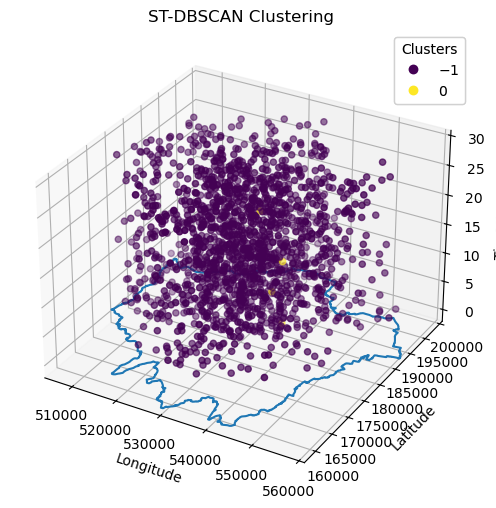

Estimated number of clusters: 1
Estimated number of noise points: 1660
Results for ST-DBSCAN for parameters: (3000, 2, 4)


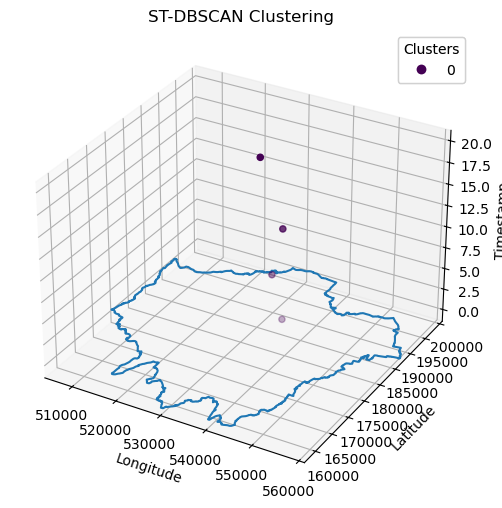

Estimated number of clusters: 1
Estimated number of noise points: 1660

Data:
            x       y       date   time  time_series  cluster
46024  537298  182839 2022-02-01  18:35           18        0
46328  534979  182841 2022-02-06  15:20          135        0
46672  537333  182841 2022-02-12  07:46          271        0
47205  532275  182841 2022-02-19  22:42          454        0


In [77]:
stdbscan_feb_2022_2 = STDBSCAN(param_grid_min_2, 'time_series_tod', boundaries)
stdbscan_feb_2022_2.run_grid_search(feb_2022)
stdbscan_feb_2022_2.run_best_params()
stdbscan_feb_2022_2.plot_results(hide_noise=False)
stdbscan_feb_2022_2.plot_results(hide_noise=True)

### 2.9 **Daily** Spatio-temporal clustering of February 2020/2021/2021
The models have found clusters but struggled to find more than 1 or 2 at a time. This section attempts to aggregate the time series to a day to see if additional clusters are identified

*Feburary 2020*

(1000, 1, 2) - Silhouette Score: -0.742030550867148
(1000, 1, 3) - Silhouette Score: -0.3781324502931291
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.7495614072727738
(1000, 2, 3) - Silhouette Score: -0.3781324502931291
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7403101664434814
(1000, 3, 3) - Silhouette Score: -0.545515730681
(1000, 3, 4) - Silhouette Score: -0.1814496818972607
(1000, 4, 2) - Silhouette Score: -0.7384653693162476
(1000, 4, 3) - Silhouette Score: -0.6100771931949143
(1000, 4, 4) - Silhouette Score: -0.1814496818972607
(1000, 5, 2) - Silhouette Score: -0.7310918759165792
(1000, 5, 3) - Silhouette Score: -0.6155703199372977
(1000, 5, 4) - Silhouette Score: -0.1814496818972607
(1000, 6, 2) - Silhouette Score: -0.7203389746884897
(1000, 6, 3) - Silhouette Score: -0.6521464828600302
(1000, 6, 4) - Silhouette Score: -0.1814496818972607
(1000, 7, 2) - Silhouette Score: -0.7078763480080104
(1000, 7, 3) - Silhouette Score:

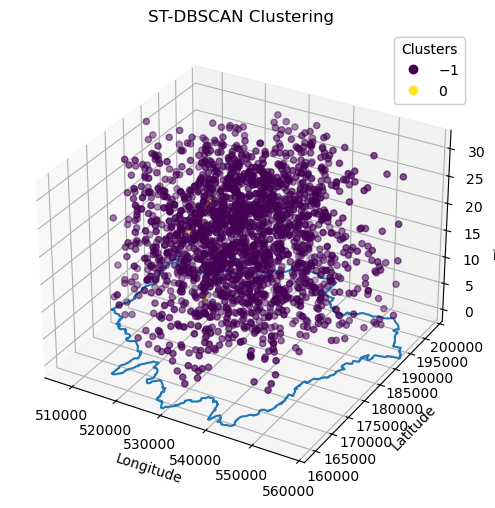

Estimated number of clusters: 1
Estimated number of noise points: 1939
Results for ST-DBSCAN for parameters: (4000, 3, 4)


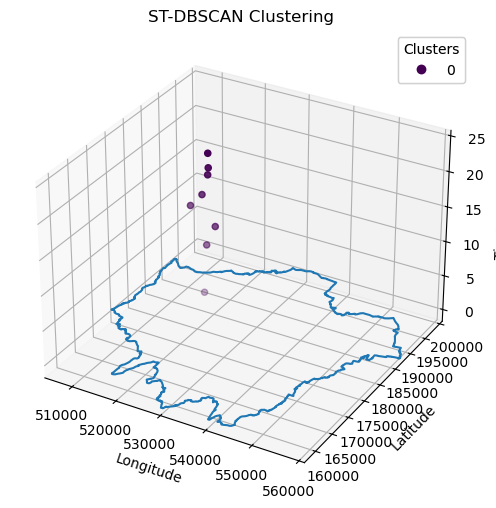

Estimated number of clusters: 1
Estimated number of noise points: 1939

Data:
           x       y       date   time  time_series  cluster
157   521701  180089 2020-01-04  19:50           91        0
484   522300  180086 2020-01-11  12:54          252        0
659   524295  180078 2020-01-14  18:55          330        0
838   518701  180078 2020-01-16  22:45          382        0
953   521341  180089 2020-01-18  13:15          421        0
1138  522672  180081 2020-01-21  15:10          495        0
1173  522809  180082 2020-01-22  08:33          512        0
1328  522732  180083 2020-01-24  14:25          566        0


In [78]:
stdbscan_feb_2020_d = STDBSCAN(param_grid_min_2, 'day', boundaries)
stdbscan_feb_2020_d.run_grid_search(feb_2020)
stdbscan_feb_2020_d.run_best_params()
stdbscan_feb_2020_d.plot_results(hide_noise=False)
stdbscan_feb_2020_d.plot_results(hide_noise=True)

*Feburary 2021*

(1000, 1, 2) - Silhouette Score: -0.6782352441908404
(1000, 1, 3) - Silhouette Score: -1
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.6933316154652291
(1000, 2, 3) - Silhouette Score: -1
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7041864876635369
(1000, 3, 3) - Silhouette Score: -1
(1000, 3, 4) - Silhouette Score: -1
(1000, 4, 2) - Silhouette Score: -0.7058530593907875
(1000, 4, 3) - Silhouette Score: -0.23115334992805214
(1000, 4, 4) - Silhouette Score: -1
(1000, 5, 2) - Silhouette Score: -0.7002975893041284
(1000, 5, 3) - Silhouette Score: -0.23115334992805214
(1000, 5, 4) - Silhouette Score: -1
(1000, 6, 2) - Silhouette Score: -0.7075975730722179
(1000, 6, 3) - Silhouette Score: -0.23115334992805214
(1000, 6, 4) - Silhouette Score: -1
(1000, 7, 2) - Silhouette Score: -0.7047956988213735
(1000, 7, 3) - Silhouette Score: -0.27113232338799975
(1000, 7, 4) - Silhouette Score: -1
(1000, 8, 2) - Silhouette Score: -0.6966723679156107


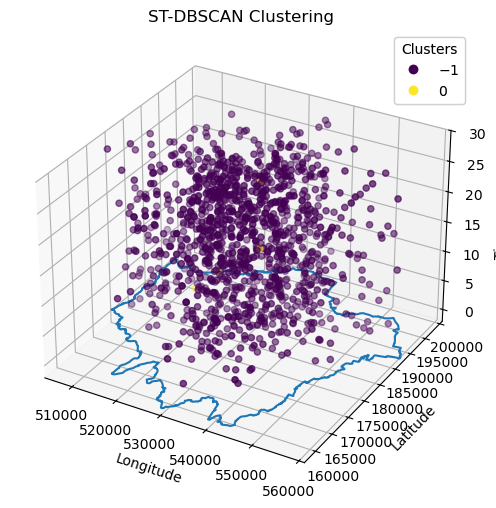

Estimated number of clusters: 1
Estimated number of noise points: 1180
Results for ST-DBSCAN for parameters: (10000, 3, 4)


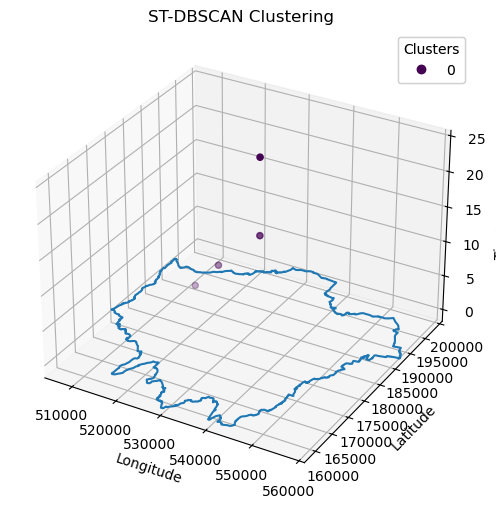

Estimated number of clusters: 1
Estimated number of noise points: 1180

Data:
            x       y       date   time  time_series  cluster
22282  517366  182859 2021-02-03  10:53           58        0
22478  522803  182859 2021-02-07  12:40          156        0
22679  532226  182856 2021-02-13  10:30          298        0
23744  532216  182860 2021-02-24  16:30          568        0


In [79]:
stdbscan_feb_2021_d = STDBSCAN(param_grid_min_2, 'day', boundaries)
stdbscan_feb_2021_d.run_grid_search(feb_2021)
stdbscan_feb_2021_d.run_best_params()
stdbscan_feb_2021_d.plot_results(hide_noise=False)
stdbscan_feb_2021_d.plot_results(hide_noise=True)

*February 2022*

(1000, 1, 2) - Silhouette Score: -0.702599306234132
(1000, 1, 3) - Silhouette Score: -0.30166538244346686
(1000, 1, 4) - Silhouette Score: -1
(1000, 2, 2) - Silhouette Score: -0.7005108160283674
(1000, 2, 3) - Silhouette Score: -0.34248424070695027
(1000, 2, 4) - Silhouette Score: -1
(1000, 3, 2) - Silhouette Score: -0.7339766102365357
(1000, 3, 3) - Silhouette Score: -0.34248424070695027
(1000, 3, 4) - Silhouette Score: -1
(1000, 4, 2) - Silhouette Score: -0.7313777797340791
(1000, 4, 3) - Silhouette Score: -0.37376048932603045
(1000, 4, 4) - Silhouette Score: -1
(1000, 5, 2) - Silhouette Score: -0.7325285274842378
(1000, 5, 3) - Silhouette Score: -0.48557597274430336
(1000, 5, 4) - Silhouette Score: -1
(1000, 6, 2) - Silhouette Score: -0.7258433954402869
(1000, 6, 3) - Silhouette Score: -0.48557597274430336
(1000, 6, 4) - Silhouette Score: -1
(1000, 7, 2) - Silhouette Score: -0.7149887921516889
(1000, 7, 3) - Silhouette Score: -0.6003204331647793
(1000, 7, 4) - Silhouette Score: -1
(

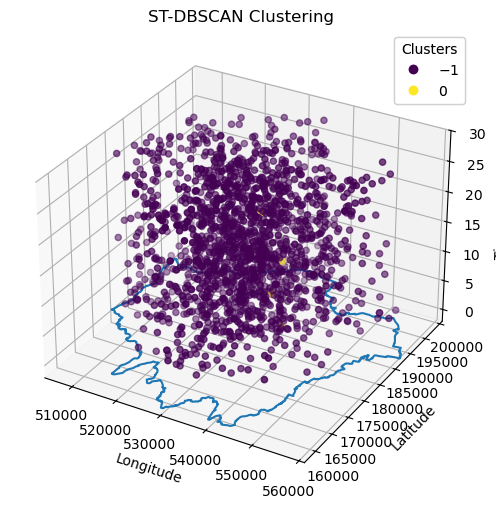

Estimated number of clusters: 1
Estimated number of noise points: 1660
Results for ST-DBSCAN for parameters: (3000, 2, 4)


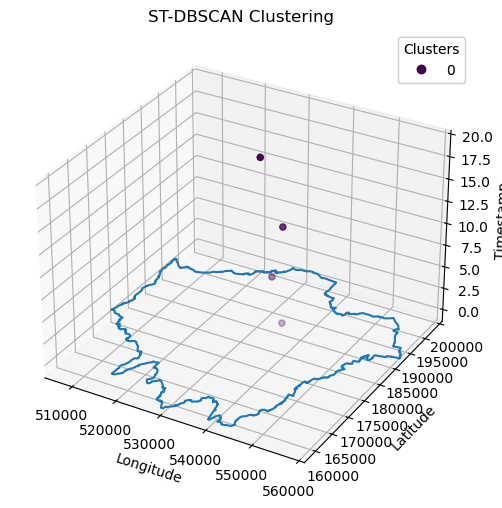

Estimated number of clusters: 1
Estimated number of noise points: 1660

Data:
            x       y       date   time  time_series  cluster
46024  537298  182839 2022-02-01  18:35           18        0
46328  534979  182841 2022-02-06  15:20          135        0
46672  537333  182841 2022-02-12  07:46          271        0
47205  532275  182841 2022-02-19  22:42          454        0


In [80]:
stdbscan_feb_2022_d = STDBSCAN(param_grid_min_2, 'day', boundaries)
stdbscan_feb_2022_d.run_grid_search(feb_2022)
stdbscan_feb_2022_d.run_best_params()
stdbscan_feb_2022_d.plot_results(hide_noise=False)
stdbscan_feb_2022_d.plot_results(hide_noise=True)

## 2.10 Manual Hyperparameter selection
The model is still struggling to find relevant clusters and it's difficult to compare the three months of Feburary we have extracted (2020/2021/2022). 

This section explores manually selecting hyperparamers based on intuition rather than using the siholette score (which has had limited impact so far). It then consistently runs the same hyperparameters over the three February datasets too identify any differences

In [81]:
# Run with 1000, 6, min samples 3
hyperparams = {'eps1': [1000], 'eps2': [6], 'min_samples': [3]}

*Feb 2020 - hourly time series*

(1000, 6, 3) - Silhouette Score: -0.6386639018794223
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.6386639018794223
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1917
 1            6
 0            3
 2            3
 3            3
 4            3
 5            3
 6            3
 7            3
 8            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


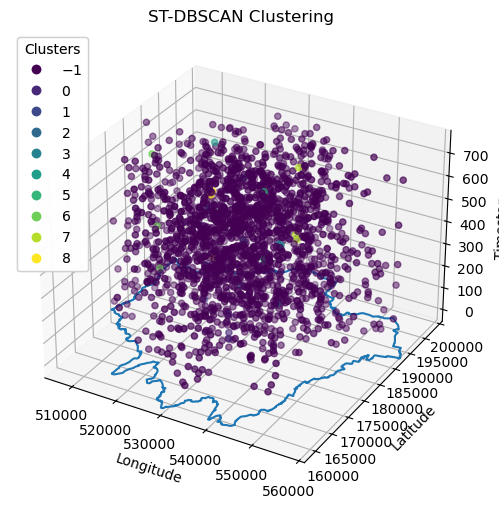

Estimated number of clusters: 9
Estimated number of noise points: 1917
Results for ST-DBSCAN for parameters: (1000, 6, 3)


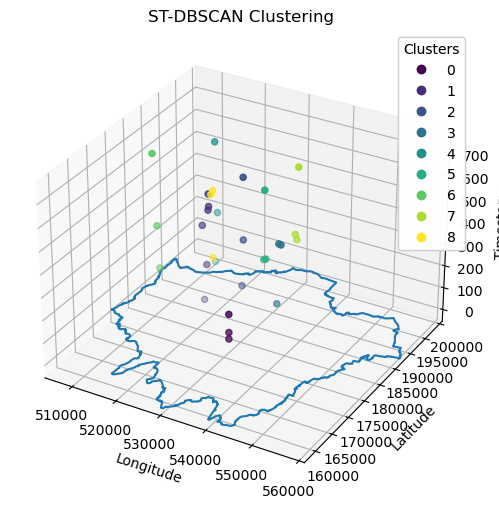

Estimated number of clusters: 9
Estimated number of noise points: 1917

Data:
           x       y       date   time  time_series  cluster
119   532631  173066 2020-01-04  01:20           73        0
157   521701  180089 2020-01-04  19:50           91        1
170   532645  173066 2020-01-05  06:45          102        0
306   532642  173066 2020-01-08  15:39          183        0
317   529686  180871 2020-01-08  22:20          190        2
335   537758  180583 2020-01-07  16:33          160        3
376   521160  184131 2020-01-09  15:02          207        4
484   522300  180086 2020-01-11  12:54          252        1
487   514798  175900 2020-01-11  08:00          248        6
571   523954  179815 2020-01-13  08:00          296        8
680   534723  181314 2020-01-14  20:00          332        5
721   534263  181313 2020-01-14  15:35          327        5
891   529988  180874 2020-01-17  11:45          395        2
953   521341  180089 2020-01-18  13:15          421        1
959   5

In [82]:
stdbscan = STDBSCAN(hyperparams, 'time_series', boundaries)
stdbscan.run_grid_search(feb_2020)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2020 - 1/4 day time series*

(1000, 6, 3) - Silhouette Score: -0.6521465873575449
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.6521465873575449
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1914
 2            6
 0            3
 1            3
 3            3
 4            3
 5            3
 6            3
 7            3
 8            3
 9            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


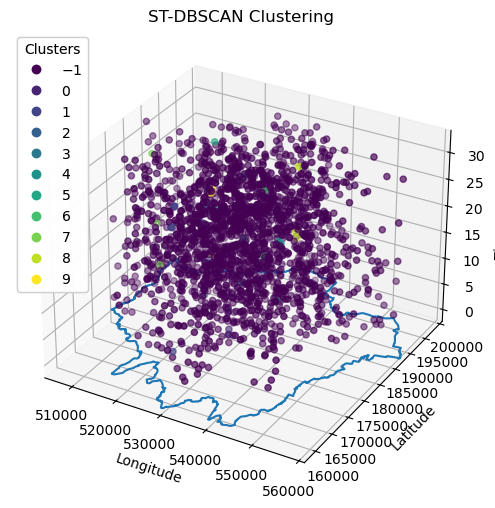

Estimated number of clusters: 10
Estimated number of noise points: 1914
Results for ST-DBSCAN for parameters: (1000, 6, 3)


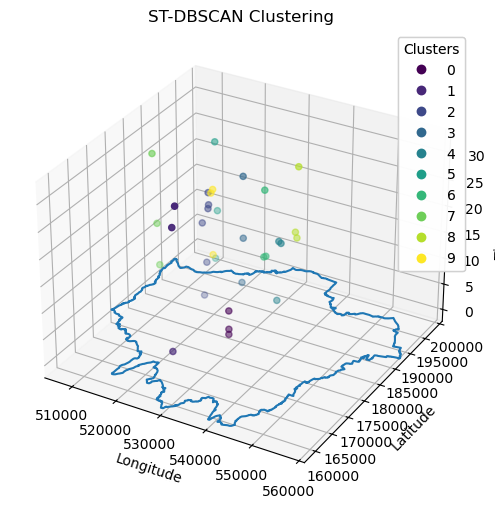

Estimated number of clusters: 10
Estimated number of noise points: 1914

Data:
           x       y       date   time  time_series  cluster
119   532631  173066 2020-01-04  01:20           73        0
144   526974  164228 2020-01-04  14:55           86        1
157   521701  180089 2020-01-04  19:50           91        2
170   532645  173066 2020-01-05  06:45          102        0
306   532642  173066 2020-01-08  15:39          183        0
317   529686  180871 2020-01-08  22:20          190        3
335   537758  180583 2020-01-07  16:33          160        4
376   521160  184131 2020-01-09  15:02          207        5
484   522300  180086 2020-01-11  12:54          252        2
487   514798  175900 2020-01-11  08:00          248        7
571   523954  179815 2020-01-13  08:00          296        9
680   534723  181314 2020-01-14  20:00          332        6
721   534263  181313 2020-01-14  15:35          327        6
891   529988  180874 2020-01-17  11:45          395        3
953   

In [83]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'time_series_tod', boundaries)
stdbscan.run_grid_search(feb_2020)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2020 - day time series*

(1000, 6, 3) - Silhouette Score: -0.6521464828600302
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.6521464828600302
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1914
 2            6
 0            3
 1            3
 3            3
 4            3
 5            3
 6            3
 7            3
 8            3
 9            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


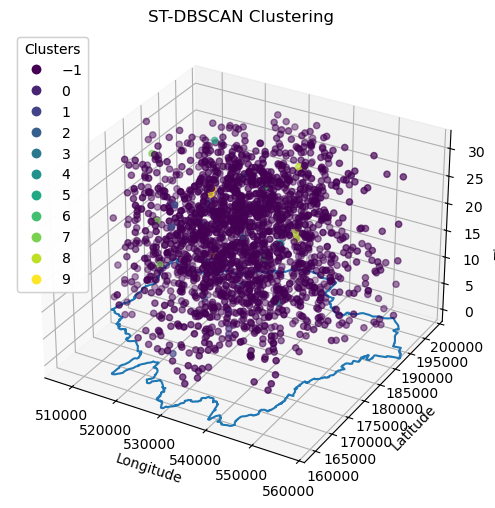

Estimated number of clusters: 10
Estimated number of noise points: 1914
Results for ST-DBSCAN for parameters: (1000, 6, 3)


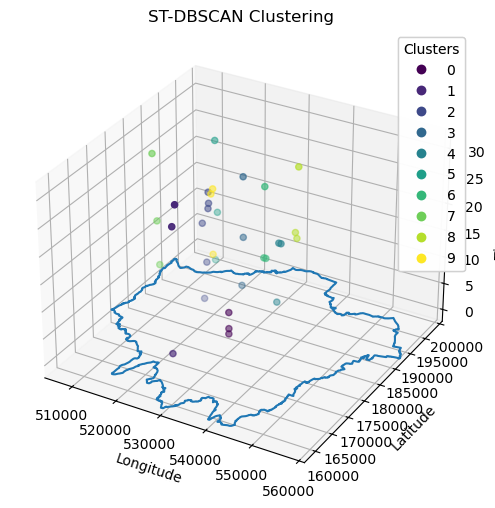

Estimated number of clusters: 10
Estimated number of noise points: 1914

Data:
           x       y       date   time  time_series  cluster
119   532631  173066 2020-01-04  01:20           73        0
144   526974  164228 2020-01-04  14:55           86        1
157   521701  180089 2020-01-04  19:50           91        2
170   532645  173066 2020-01-05  06:45          102        0
306   532642  173066 2020-01-08  15:39          183        0
317   529686  180871 2020-01-08  22:20          190        3
335   537758  180583 2020-01-07  16:33          160        4
376   521160  184131 2020-01-09  15:02          207        5
484   522300  180086 2020-01-11  12:54          252        2
487   514798  175900 2020-01-11  08:00          248        7
571   523954  179815 2020-01-13  08:00          296        9
680   534723  181314 2020-01-14  20:00          332        6
721   534263  181313 2020-01-14  15:35          327        6
891   529988  180874 2020-01-17  11:45          395        3
953   

In [84]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'day', boundaries)
stdbscan.run_grid_search(feb_2020)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2021 - hourly time series*

(1000, 6, 3) - Silhouette Score: -0.23106624254984814
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.23106624254984814
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1181
 0            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


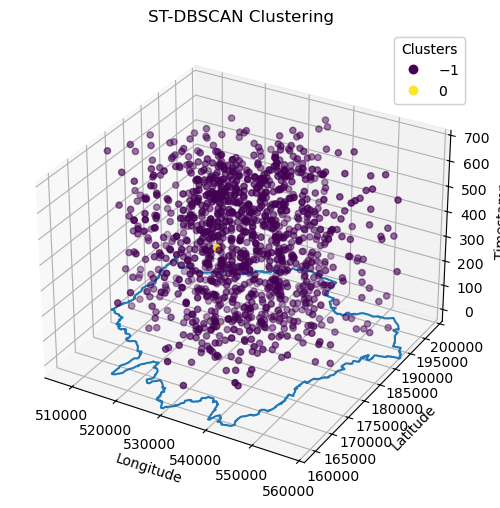

Estimated number of clusters: 1
Estimated number of noise points: 1181
Results for ST-DBSCAN for parameters: (1000, 6, 3)


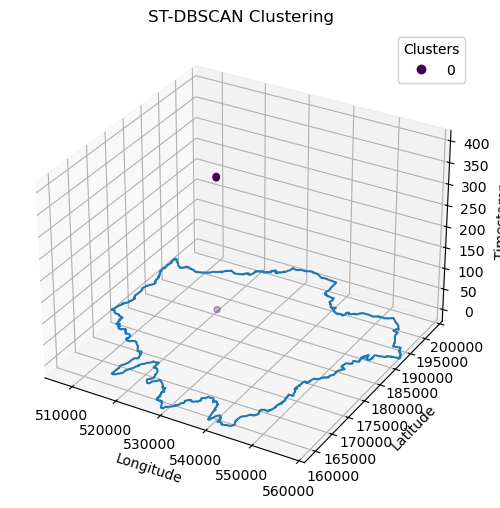

Estimated number of clusters: 1
Estimated number of noise points: 1181

Data:
            x       y       date   time  time_series  cluster
22356  528929  174484 2021-02-04  15:57           87        0
22821  528923  174485 2021-02-17  08:11          392        0
22827  528933  174480 2021-02-17  11:15          395        0


In [85]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'time_series', boundaries)
stdbscan.run_grid_search(feb_2021)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2021 - 1/4 day time series*

(1000, 6, 3) - Silhouette Score: -0.2311533224562985
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.2311533224562985
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1181
 0            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


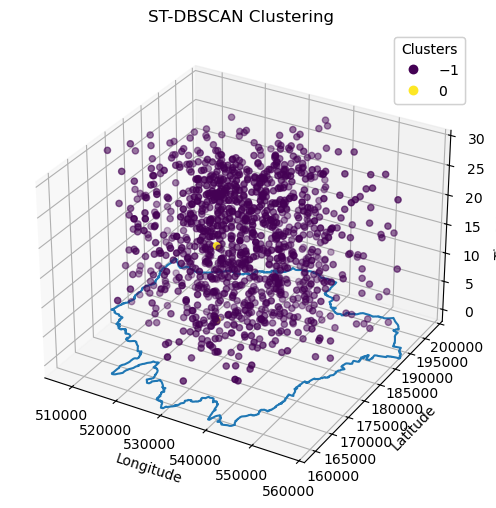

Estimated number of clusters: 1
Estimated number of noise points: 1181
Results for ST-DBSCAN for parameters: (1000, 6, 3)


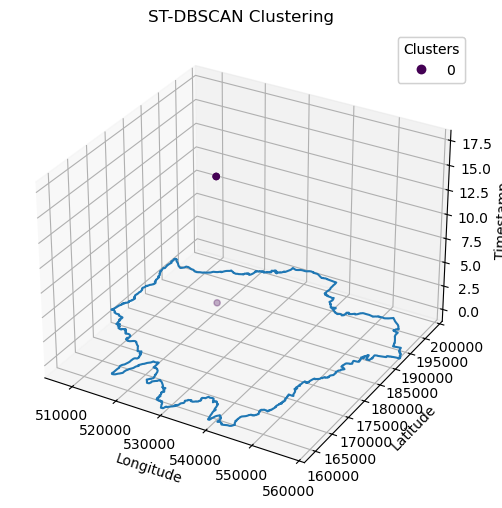

Estimated number of clusters: 1
Estimated number of noise points: 1181

Data:
            x       y       date   time  time_series  cluster
22356  528929  174484 2021-02-04  15:57           87        0
22821  528923  174485 2021-02-17  08:11          392        0
22827  528933  174480 2021-02-17  11:15          395        0


In [86]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'time_series_tod', boundaries)
stdbscan.run_grid_search(feb_2021)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2021 - day time series*

(1000, 6, 3) - Silhouette Score: -0.23115334992805214
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.23115334992805214
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1181
 0            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


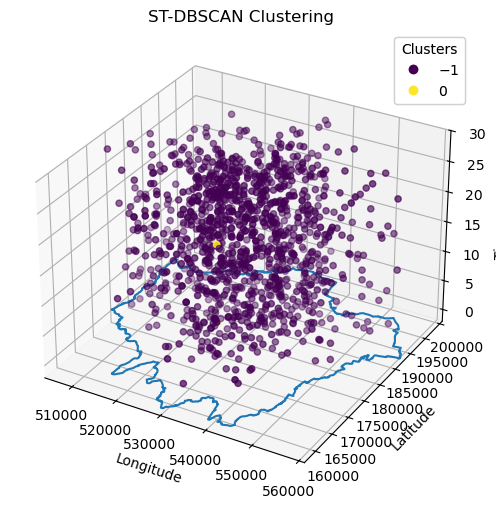

Estimated number of clusters: 1
Estimated number of noise points: 1181
Results for ST-DBSCAN for parameters: (1000, 6, 3)


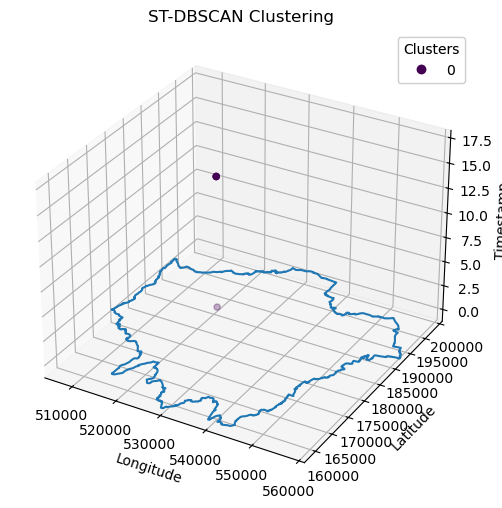

Estimated number of clusters: 1
Estimated number of noise points: 1181

Data:
            x       y       date   time  time_series  cluster
22356  528929  174484 2021-02-04  15:57           87        0
22821  528923  174485 2021-02-17  08:11          392        0
22827  528933  174480 2021-02-17  11:15          395        0


In [87]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'day', boundaries)
stdbscan.run_grid_search(feb_2021)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2022 - hourly time series*

(1000, 6, 3) - Silhouette Score: -0.48518317591047366
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.48518317591047366
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1652
 0            3
 1            3
 2            3
 3            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


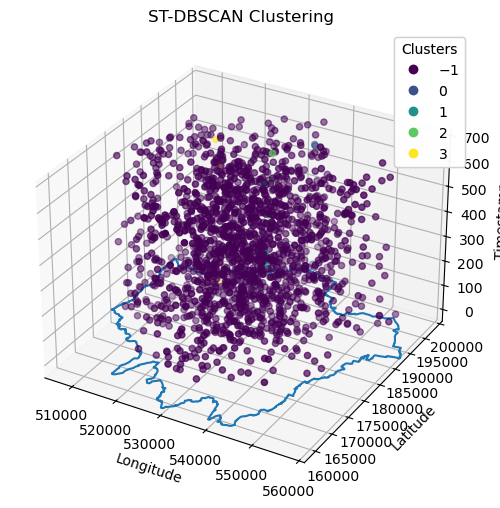

Estimated number of clusters: 4
Estimated number of noise points: 1652
Results for ST-DBSCAN for parameters: (1000, 6, 3)


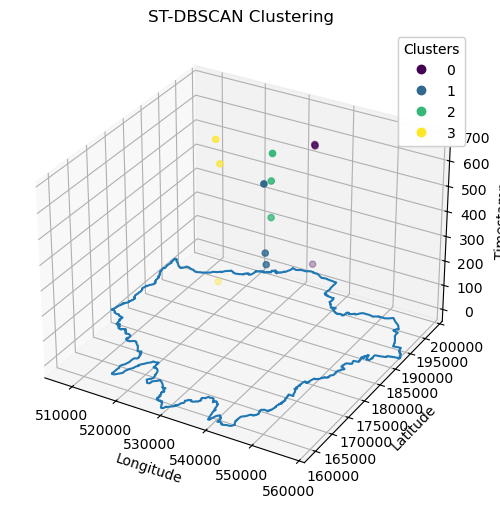

Estimated number of clusters: 4
Estimated number of noise points: 1652

Data:
            x       y       date   time  time_series  cluster
46149  519805  186585 2022-02-03  20:12           68        3
46558  534589  196260 2022-02-05  08:20          104        0
46695  534808  181313 2022-02-12  14:10          278        1
46760  534579  181315 2022-02-14  11:32          323        1
47009  533284  184799 2022-02-18  10:02          418        2
47319  533287  184800 2022-02-24  10:50          562        2
47330  520388  186583 2022-02-23  21:00          549        3
47402  534225  181314 2022-02-25  17:00          593        1
47686  533518  184804 2022-02-28  22:30          670        2
47762  534665  196260 2022-02-25  14:30          590        0
48106  534744  196258 2022-02-25  09:00          585        0
48391  519495  186578 2022-02-27  17:37          641        3


In [88]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'time_series', boundaries)
stdbscan.run_grid_search(feb_2022)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2022 - 1/4 day time series*

(1000, 6, 3) - Silhouette Score: -0.485575978668306
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.485575978668306
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1652
 0            3
 1            3
 2            3
 3            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


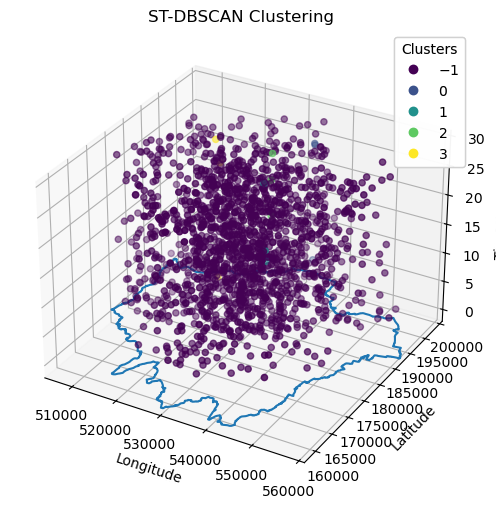

Estimated number of clusters: 4
Estimated number of noise points: 1652
Results for ST-DBSCAN for parameters: (1000, 6, 3)


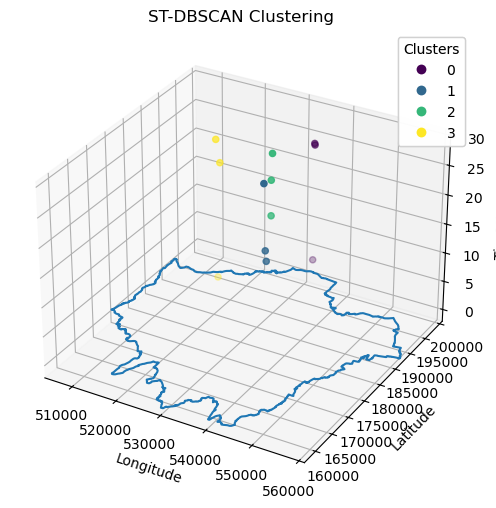

Estimated number of clusters: 4
Estimated number of noise points: 1652

Data:
            x       y       date   time  time_series  cluster
46149  519805  186585 2022-02-03  20:12           68        3
46558  534589  196260 2022-02-05  08:20          104        0
46695  534808  181313 2022-02-12  14:10          278        1
46760  534579  181315 2022-02-14  11:32          323        1
47009  533284  184799 2022-02-18  10:02          418        2
47319  533287  184800 2022-02-24  10:50          562        2
47330  520388  186583 2022-02-23  21:00          549        3
47402  534225  181314 2022-02-25  17:00          593        1
47686  533518  184804 2022-02-28  22:30          670        2
47762  534665  196260 2022-02-25  14:30          590        0
48106  534744  196258 2022-02-25  09:00          585        0
48391  519495  186578 2022-02-27  17:37          641        3


In [89]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'time_series_tod', boundaries)
stdbscan.run_grid_search(feb_2022)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)

*Feb 2022 - day time series*

(1000, 6, 3) - Silhouette Score: -0.48557597274430336
Total completed:  1
Best parameters: (1000, 6, 3) with a score of -0.48557597274430336
Running ST-DBSCAN for parameters: (1000, 6, 3)
cluster
-1         1652
 0            3
 1            3
 2            3
 3            3
Name: count, dtype: int64
Results for ST-DBSCAN for parameters: (1000, 6, 3)


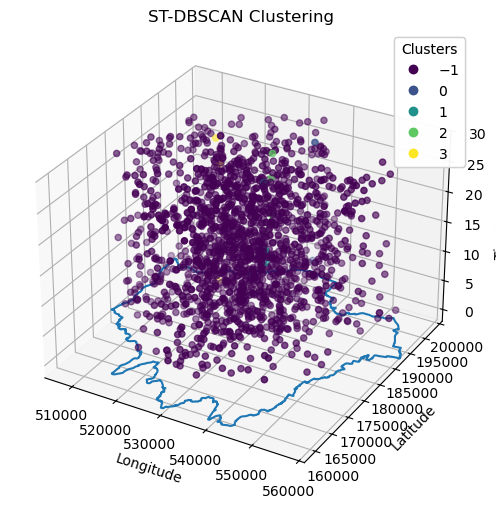

Estimated number of clusters: 4
Estimated number of noise points: 1652
Results for ST-DBSCAN for parameters: (1000, 6, 3)


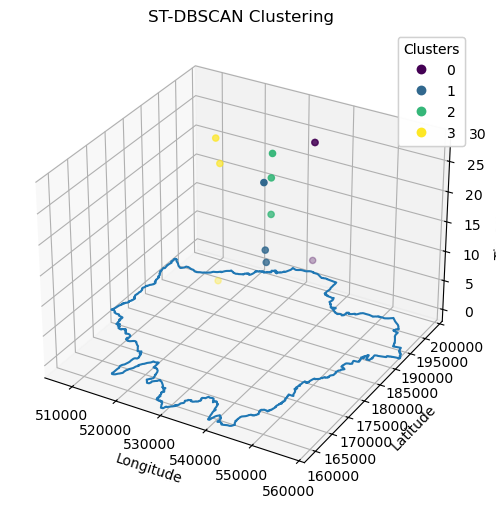

Estimated number of clusters: 4
Estimated number of noise points: 1652

Data:
            x       y       date   time  time_series  cluster
46149  519805  186585 2022-02-03  20:12           68        3
46558  534589  196260 2022-02-05  08:20          104        0
46695  534808  181313 2022-02-12  14:10          278        1
46760  534579  181315 2022-02-14  11:32          323        1
47009  533284  184799 2022-02-18  10:02          418        2
47319  533287  184800 2022-02-24  10:50          562        2
47330  520388  186583 2022-02-23  21:00          549        3
47402  534225  181314 2022-02-25  17:00          593        1
47686  533518  184804 2022-02-28  22:30          670        2
47762  534665  196260 2022-02-25  14:30          590        0
48106  534744  196258 2022-02-25  09:00          585        0
48391  519495  186578 2022-02-27  17:37          641        3


In [90]:
# Run with 1000, 6, min samples 3
stdbscan = STDBSCAN(hyperparams, 'day', boundaries)
stdbscan.run_grid_search(feb_2022)
stdbscan.run_best_params()
stdbscan.plot_results(hide_noise=False)
stdbscan.plot_results(hide_noise=True)